Sara Cruz
Atlanta Hawks Basketball Strategy & Analytics Internship (2023) - Assignment

In [1]:
import pandas as pd
import numpy as np
import decimal
import math
from matplotlib import pyplot as plt
pd.options.display.max_columns = None


In [2]:
NBA_DRAFT = pd.read_csv("nbaplayersdraft.csv")
NBA_DRAFT = NBA_DRAFT.where(pd.notnull(NBA_DRAFT), 0)


Part 1: Data Comprehension (estimated time: 1.5 hours)

(A) Which NBA team(s) has drafted the most players who…

    a. went to Duke and were drafted in or before the 2000 draft?


In [3]:
NBA_DRAFT_DUKE = NBA_DRAFT[(NBA_DRAFT["college"] == "Duke") & (NBA_DRAFT['year'] <= 2000)]

NBA_DRAFT_DUKE_GB = NBA_DRAFT_DUKE.groupby("team").count().sort_values(by = 'id', ascending = False)
MAX_DUKE_ROOKIES_DRAFTED = NBA_DRAFT_DUKE_GB["id"].max()
NBA_DRAFT_DUKE_GB = NBA_DRAFT_DUKE_GB[NBA_DRAFT_DUKE_GB['id'] == MAX_DUKE_ROOKIES_DRAFTED]

NBA_DRAFT_DUKE_GB = NBA_DRAFT_DUKE_GB.index.to_list()

NBA_TEAM_DUKE = pd.DataFrame() 
for team in NBA_DRAFT_DUKE_GB:
    NBA_DRAFT_DUKE_PLAYERS = NBA_DRAFT_DUKE[(NBA_DRAFT_DUKE["team"] == team)]
    NBA_TEAM_DUKE = pd.concat([NBA_TEAM_DUKE,NBA_DRAFT_DUKE_PLAYERS], ignore_index = True)
    NBA_TEAM_DUKE.columns = NBA_DRAFT_DUKE_PLAYERS.columns

NBA_TEAM_DUKE = NBA_TEAM_DUKE[['team', 'year', 'player']]
display(NBA_TEAM_DUKE)
  

print("Teams that drafted the most players (" + str(MAX_DUKE_ROOKIES_DRAFTED) + ") from Duke: ", NBA_DRAFT_DUKE_GB)

,team,year,player
0,DAL,1990,Phil Henderson
1,DAL,1995,Cherokee Parks
2,MIN,1992,Christian Laettner
3,MIN,1999,William Avery
4,PHO,1992,Brian Davis
5,PHO,1994,Antonio Lang


Teams that drafted the most players (2) from Duke:  ['DAL', 'MIN', 'PHO']


    b. have a first name that begins with D and were drafted in an even year draft (1990, 1992, 1994, …)?

In [4]:
NBA_DRAFT_D = NBA_DRAFT[NBA_DRAFT['player'].str.startswith('D')]
NBA_DRAFT_D['even_year'] = NBA_DRAFT_D['year'] % 2
NBA_DRAFT_D_2 = NBA_DRAFT_D[NBA_DRAFT_D["even_year"] == 0].reset_index(drop = True)
NBA_DRAFT_D_2


NBA_DRAFT_D_2_GB = NBA_DRAFT_D_2.groupby("team").count().sort_values(by = 'id', ascending = False)
MAX_NBA_DRAFT_D_2_GB = NBA_DRAFT_D_2_GB["id"].max()
NBA_DRAFT_D_2_GB = NBA_DRAFT_D_2_GB[NBA_DRAFT_D_2_GB['id'] == MAX_NBA_DRAFT_D_2_GB]

NBA_DRAFT_D_2_GB = NBA_DRAFT_D_2_GB.index.to_list()

NBA_TEAM_D_2 = pd.DataFrame() 
for team in NBA_DRAFT_D_2_GB:
    NBA_DRAFT_D_2_PLAYERS = NBA_DRAFT_D_2[(NBA_DRAFT_D_2["team"] == team)]
    NBA_TEAM_D_2 = pd.concat([NBA_TEAM_D_2,NBA_DRAFT_D_2_PLAYERS], ignore_index = True)
    NBA_TEAM_D_2.columns = NBA_DRAFT_D_2_PLAYERS.columns

NBA_TEAM_D_2 = NBA_TEAM_D_2[['team', 'year', 'player']]
display(NBA_TEAM_D_2)

print("Teams that drafted the most (" + str(MAX_NBA_DRAFT_D_2_GB) + ") D named players on even years from Duke: ", NBA_DRAFT_D_2_GB)


/var/folders/t_/4n8p8d1n181ftg5ns2231ydw0000gn/T/ipykernel_36709/44149813.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  NBA_DRAFT_D['even_year'] = NBA_DRAFT_D['year'] % 2


,team,year,player
0,MIL,1998,Dirk Nowitzki
1,MIL,2002,Dan Gadzuric
2,MIL,2006,David Noel
3,MIL,2010,Darington Hobson
4,MIL,2012,Doron Lamb
5,MIL,2014,Damien Inglis
6,MIL,2018,Donte DiVincenzo
7,BOS,1990,Dee Brown
8,BOS,1992,Darren Morningstar
9,BOS,2002,Darius Songaila


Teams that drafted the most (7) D named players on even years from Duke:  ['MIL', 'BOS', 'SEA']


    (B) Describe the relationship between a team’s first round pick slot in one year with their first-round pick slot in the subsequent year.

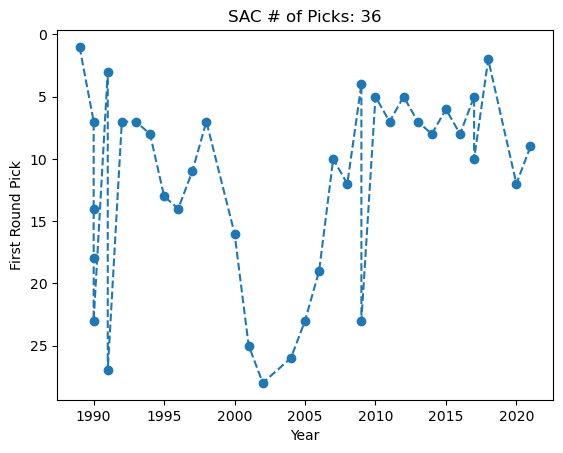

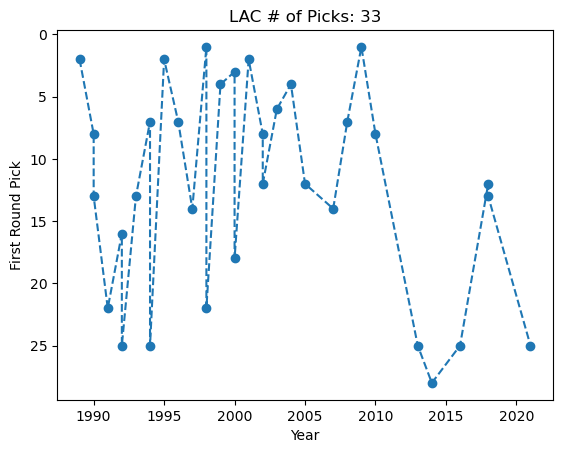

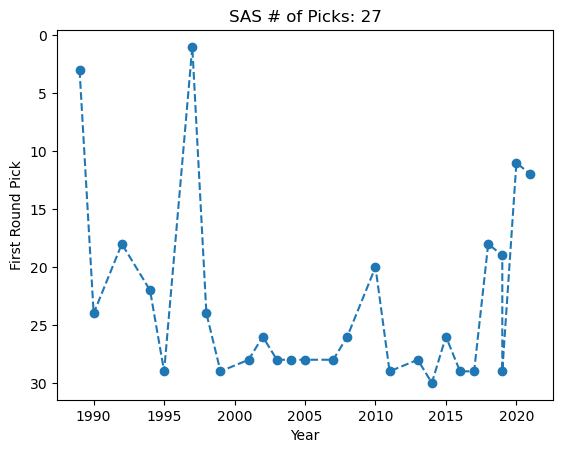

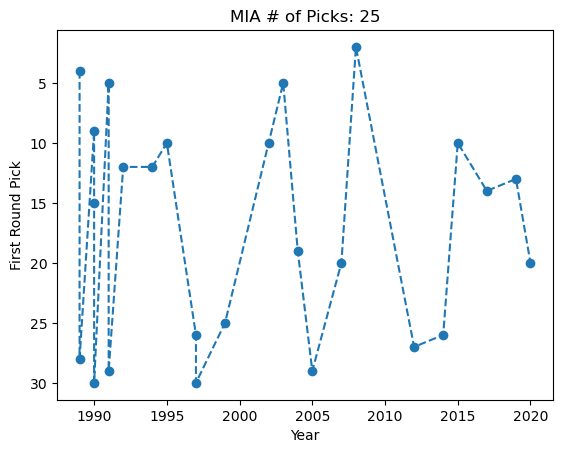

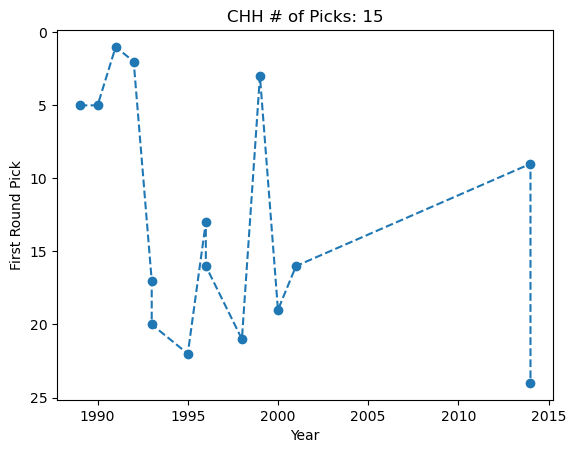

...

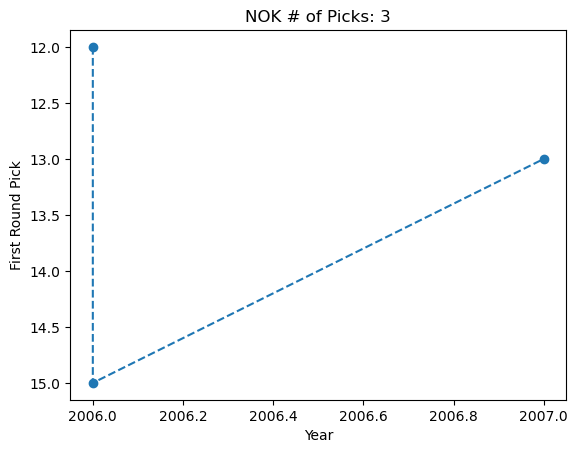

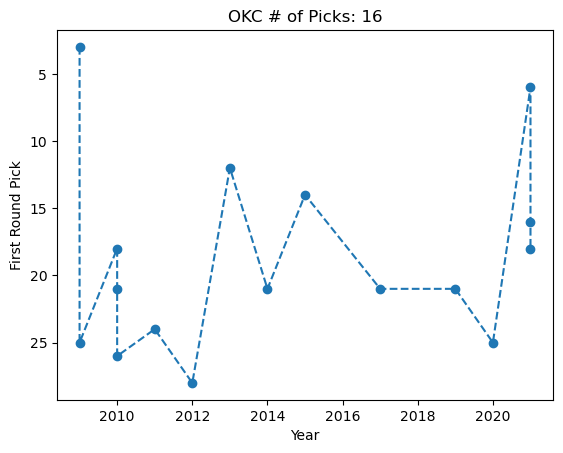

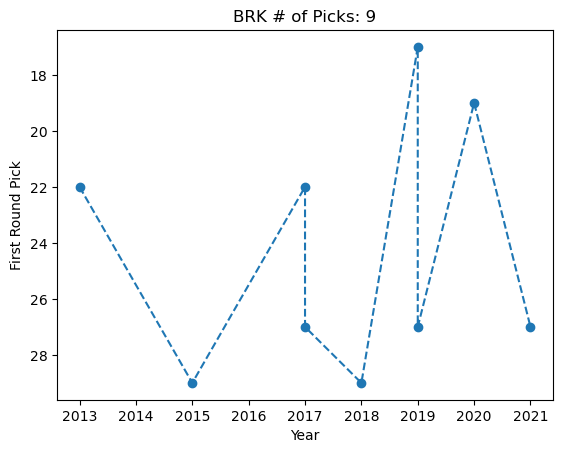

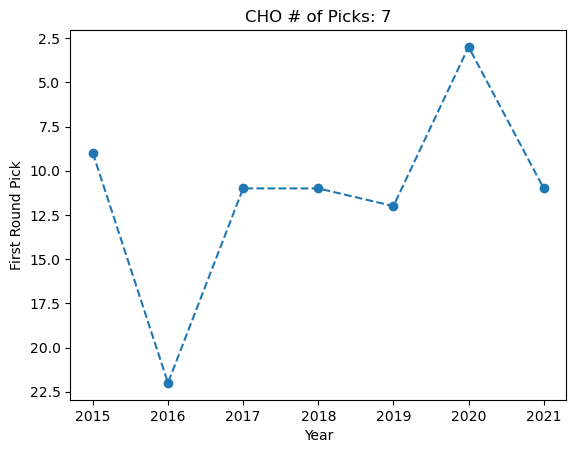

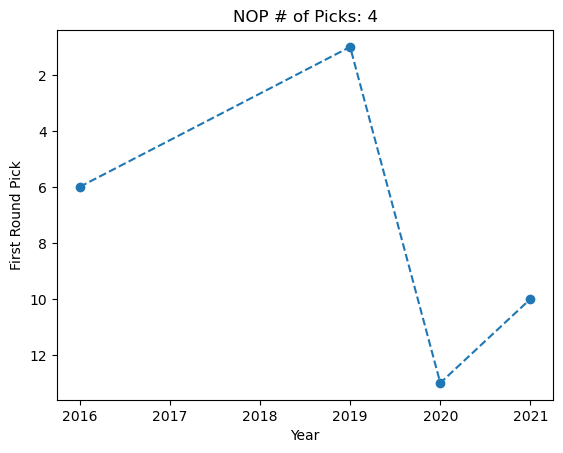

In [5]:
for team in NBA_DRAFT['team'].unique():
    # if 'NOP' == team or '':
    TEAM_NBA_DRAFT = NBA_DRAFT[NBA_DRAFT['team'] == team]
    TEAM_NBA_DRAFT = TEAM_NBA_DRAFT[TEAM_NBA_DRAFT['overall_pick'] <= ((1/2) * TEAM_NBA_DRAFT['overall_pick'].max())]
    # print(team, TEAM_NBA_DRAFT.shape[0])
    plt.plot(TEAM_NBA_DRAFT["year"], TEAM_NBA_DRAFT["overall_pick"], 'o', linestyle='dashed')
    plt.title(str(team) + ' # of Picks: ' + str(TEAM_NBA_DRAFT.shape[0]))
    plt.xlabel('Year')
    plt.ylabel('First Round Pick')


    plt.gca().invert_yaxis()
    plt.show()


Part 2: Analytical Acumen (estimated time: 3.5 hours)
Use your own judgement, interpretation and assumptions when responding to any of the open-ended questions. Specify any assumptions you make, where applicable.


    (A) Prompt: Analyze draft position value and team success/deficiencies compared to expectation.
    
        a. Create a method for valuing each draft slot in the NBA Draft (picks 1 through 60 in most drafts).


Note: Not including Round Definition. Not including upgrades in technology.

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING
0,1,1989,1,1,SAC,Pervis Ellison,Louisville,11.0,474.0,11593.0,4494.0,3170.0,691.0,0.510,0.050,0.689,24.5,9.5,6.7,1.5,21.8,0.090,-0.5,4.4,100.0,
1,2,1989,2,2,LAC,Danny Ferry,Duke,13.0,917.0,18133.0,6439.0,2550.0,1185.0,0.446,0.393,0.840,19.8,7.0,2.8,1.3,34.8,0.092,-0.9,4.9,84.9485,
2,3,1989,3,3,SAS,Sean Elliott,Arizona,12.0,742.0,24502.0,10544.0,3204.0,1897.0,0.465,0.375,0.799,33.0,14.2,4.3,2.6,55.7,0.109,0.2,13.5,76.143937,
3,4,1989,4,4,MIA,Glen Rice,Michigan,15.0,1000.0,34985.0,18336.0,4387.0,2097.0,0.456,0.400,0.846,35.0,18.3,4.4,2.1,88.7,0.122,0.8,24.9,69.897,
4,5,1989,5,5,CHH,J.R. Reid,UNC,11.0,672.0,15370.0,5680.0,3381.0,639.0,0.472,0.135,0.716,22.9,8.5,5.0,1.0,22.5,0.070,-2.9,-3.7,65.0515,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1917,1918,2021,56,56,CHO,Scottie Lewis,Florida,1.0,2.0,7.0,1.0,0.0,1.0,0.000,0.000,0.500,3.5,0.5,0.0,0.5,0.0,0.164,6.0,0.0,12.590599,
1918,1919,2021,57,57,CHO,Balša Koprivica,Florida State,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,12.206257,
1919,1920,2021,58,58,NYK,Jericho Sims,Texas,1.0,41.0,555.0,90.0,169.0,21.0,0.722,0.000,0.414,13.5,2.2,4.1,0.5,1.5,0.128,-1.7,0.0,11.8286,
1920,1921,2021,59,59,BRK,RaiQuan Gray,Florida State,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,11.457399,


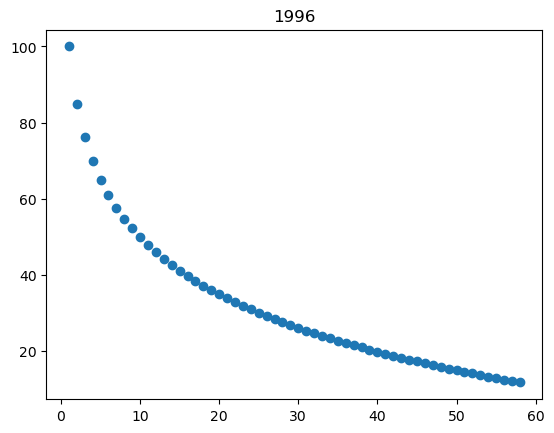

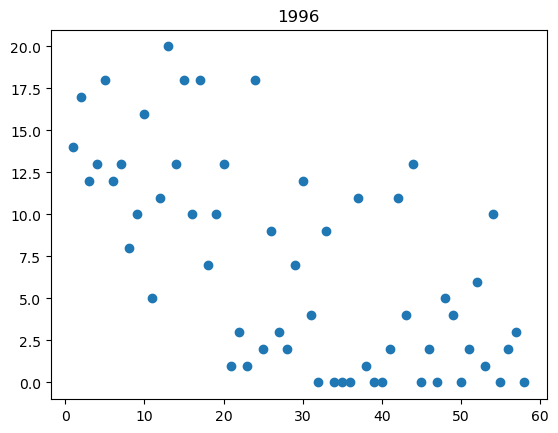

In [6]:
NBA_DRAFT['DRAFT_PICK_RANKING'] = ""
NBA_DRAFT['OVERALL_PICK_RANKING'] = ""

for YEAR in NBA_DRAFT['year'].unique():
    NBA_DRAFT_YEAR = NBA_DRAFT[NBA_DRAFT['year'] == YEAR]
    MAX_ACTIVE_YEARS = NBA_DRAFT_YEAR['years_active'].max()

    for pick in NBA_DRAFT_YEAR['overall_pick'].unique():
        NBA_DRAFT_YEAR_PICK = NBA_DRAFT_YEAR[NBA_DRAFT_YEAR['overall_pick'] == pick]
        STATS =  NBA_DRAFT_YEAR_PICK.iloc[:,7]
        if 'NaN' in str(STATS):
            STATS = float(0)
        else:
            STATS = float(STATS)

        PERCENT_YEARS = STATS / MAX_ACTIVE_YEARS
        # Draft Pick Ranking
        PICK_RANKING = (2 - (np.log10(pick))) * 50
        NBA_DRAFT.loc[(NBA_DRAFT['year'] == YEAR) & (NBA_DRAFT['overall_pick'] == pick), 'DRAFT_PICK_RANKING'] = PICK_RANKING
        NBA_DRAFT_YEAR.loc[(NBA_DRAFT_YEAR['year'] == YEAR) & (NBA_DRAFT_YEAR['overall_pick'] == pick), 'DRAFT_PICK_RANKING'] = PICK_RANKING

# ---------------------------------
# Test output:
YEAR = 1996
NBA_DRAFT_YEAR = NBA_DRAFT[NBA_DRAFT['year'] == YEAR]

display(NBA_DRAFT)

plt.plot(NBA_DRAFT_YEAR["overall_pick"], NBA_DRAFT_YEAR["DRAFT_PICK_RANKING"], 'o')
plt.title(YEAR)
plt.show()

plt.plot(NBA_DRAFT_YEAR["overall_pick"], NBA_DRAFT_YEAR["years_active"], 'o')
plt.title(YEAR)
plt.show()

1989


['Vlade Divac', 'Clifford Robinson', 'Haywoode Workman']

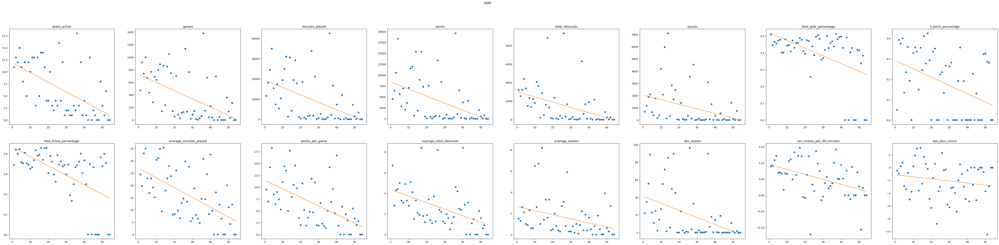

1990


['Toni Kukoč', 'Cedric Ceballos']

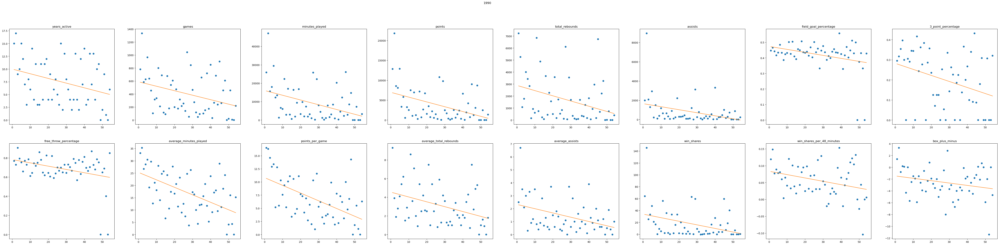

1991


['Rick Fox', 'Bobby Phills', 'Richard Dumas']

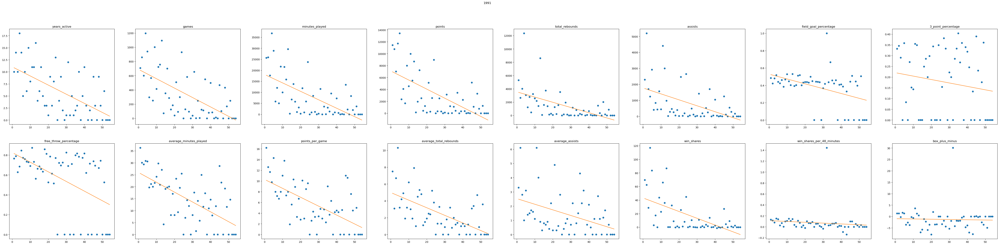

1992


['Latrell Sprewell', 'Popeye Jones', 'Chris King']

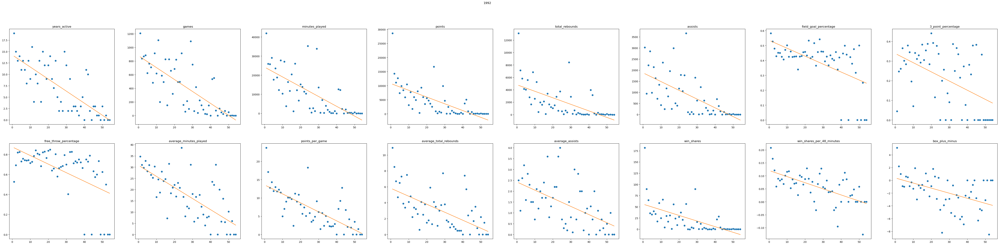

1993


['Chris Mills',
 'Sam Cassell',
 'Lucious Harris',
 'Nick Van Exel',
 'Bryon Russell',
 'Chris Whitney']

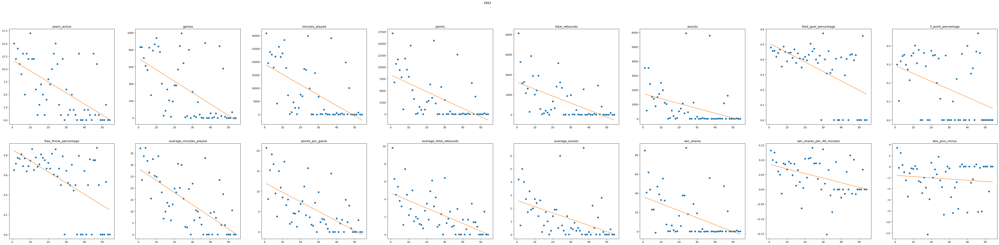

1994


['Grant Hill',
 'Wesley Person',
 'Voshon Lenard',
 'Jamie Watson',
 'Lawrence Funderburke',
 'Anthony Goldwire']

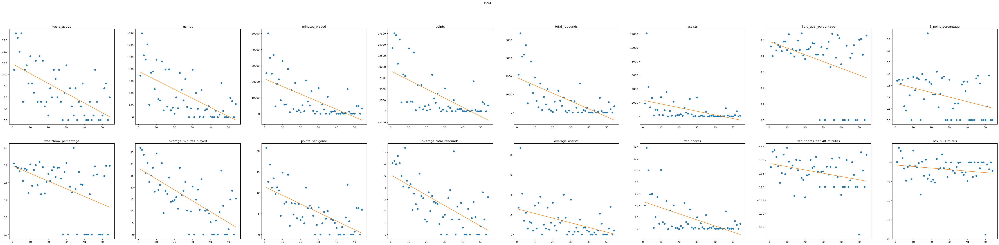

1995


['Michael Finley',
 'Eric Snow',
 'Tyus Edney',
 'Mark Davis',
 'Fred Hoiberg',
 'Chris Carr']

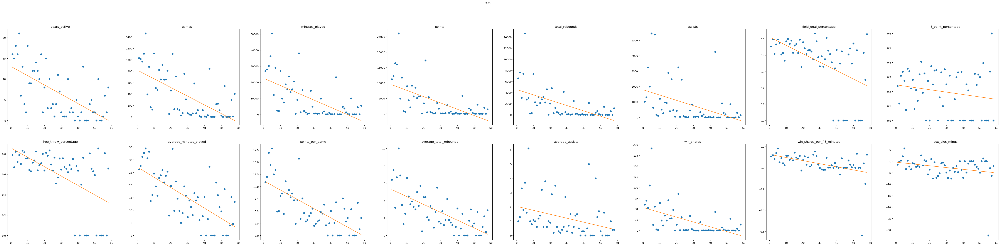

1996


['Kobe Bryant', 'Malik Rose', 'Shandon Anderson', 'Reggie Geary']

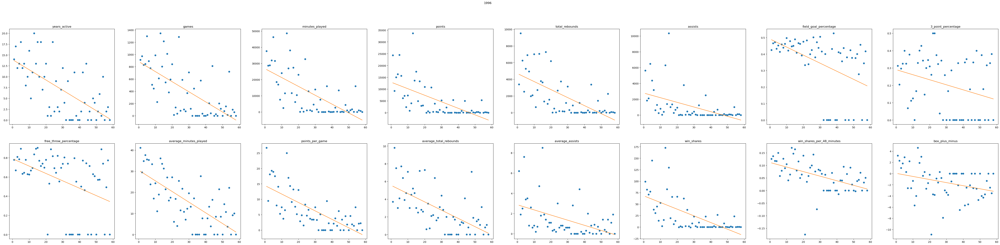

1997


['Bobby Jackson', 'Anthony Johnson', 'Stephen Jackson', 'Alvin Williams']

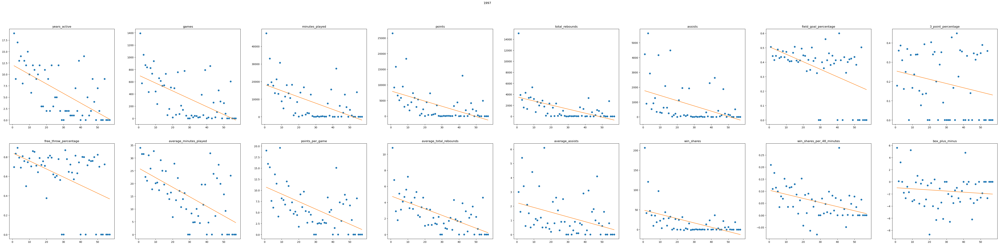

1998


['Dirk Nowitzki',
 'Rashard Lewis',
 'Cuttino Mobley',
 'Greg Buckner',
 'Tremaine Fowlkes',
 'Ryan Bowen']

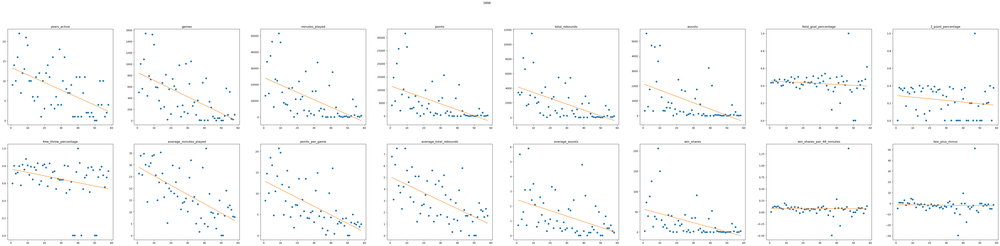

1999


['Metta World Peace', 'Andrei Kirilenko', 'Manu Ginóbili']

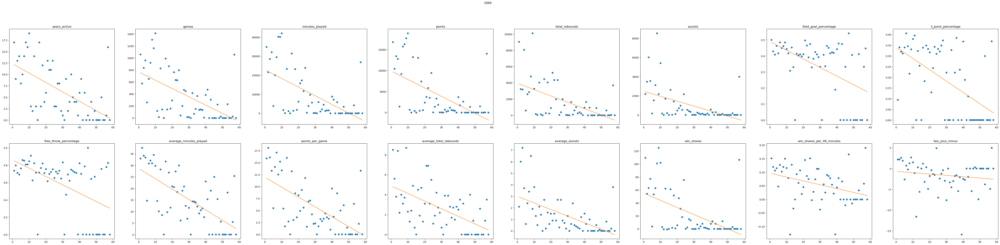

2000


['Morris Peterson',
 'Marko Jarić',
 'Michael Redd',
 'Brian Cardinal',
 'Jason Hart']

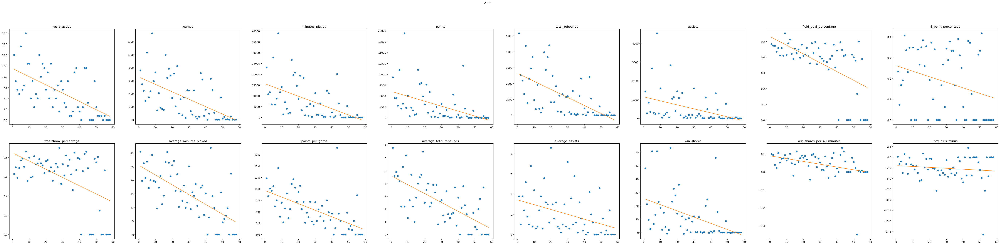

2001


['Zach Randolph',
 'Gerald Wallace',
 'Gilbert Arenas',
 'Mehmet Okur',
 'Earl Watson',
 'Bobby Simmons']

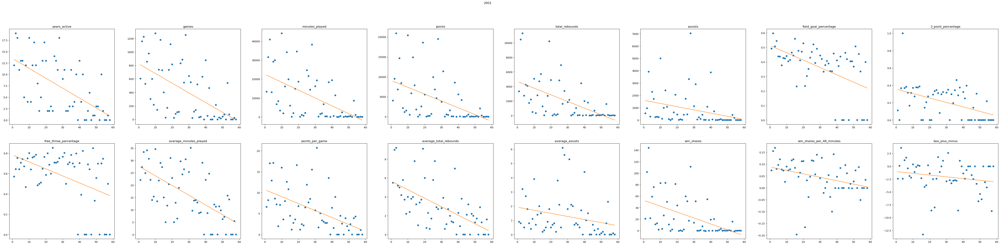

2002


['Caron Butler',
 'Tayshaun Prince',
 'John Salmons',
 'Matt Barnes',
 'Rasual Butler',
 'Luis Scola']

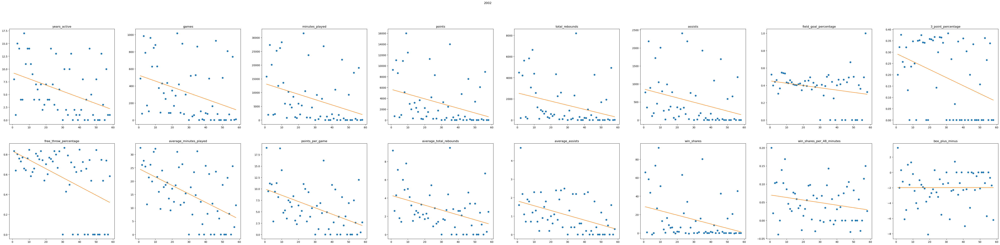

2003


['David West',
 'Boris Diaw',
 'Steve Blake',
 'Willie Green',
 'Keith Bogans',
 'Matt Bonner',
 'Mo Williams',
 'Kyle Korver']

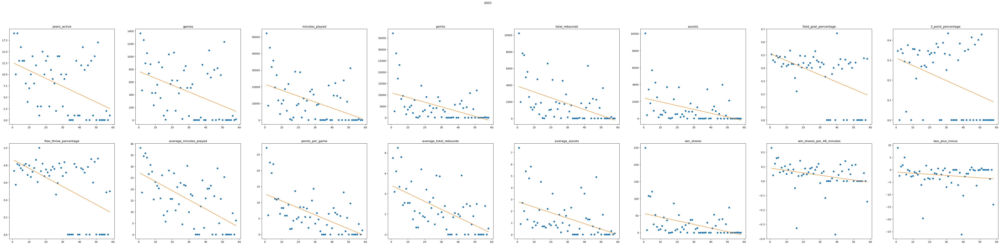

2004


['Kevin Martin', 'Chris Duhon', 'Trevor Ariza']

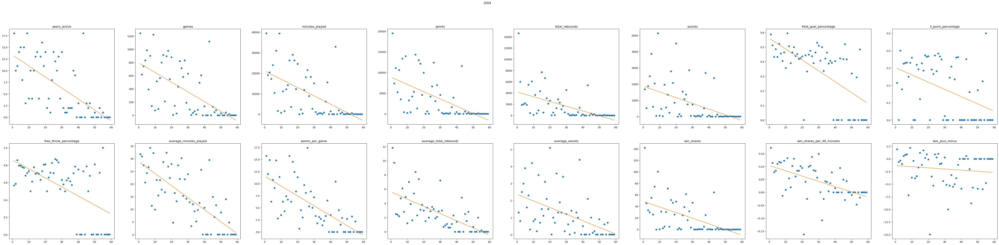

2005


['Chris Paul', 'Monta Ellis', 'Andray Blatche', 'Ryan Gomes', 'Amir Johnson']

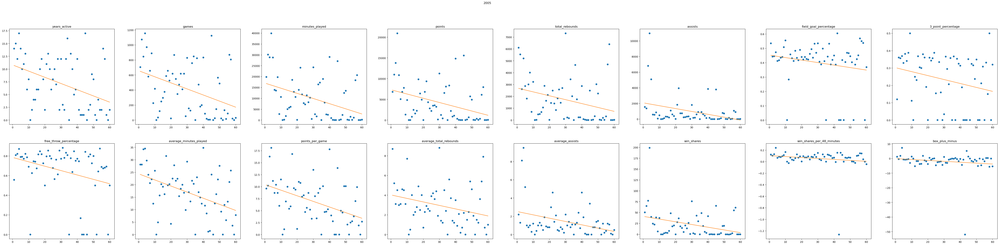

2006


['Kyle Lowry', 'P.J. Tucker', 'Daniel Gibson', 'Paul Millsap']

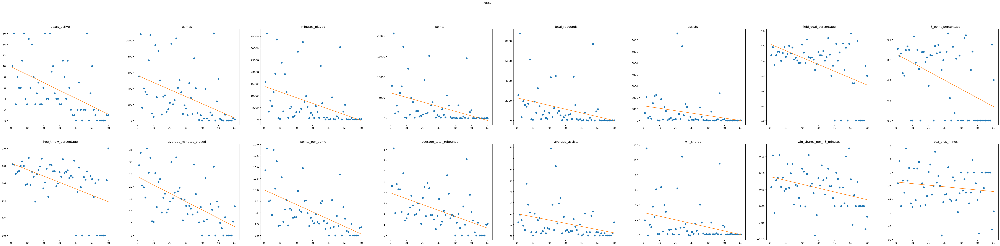

2007


['Wilson Chandler', 'Marc Gasol', 'Ramon Sessions']

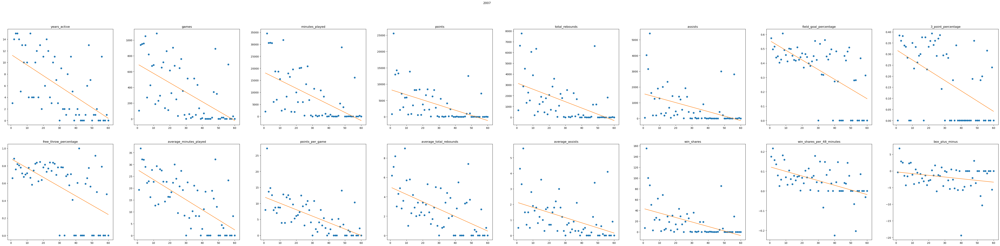

2008


['Nicolas Batum', 'Goran Dragić']

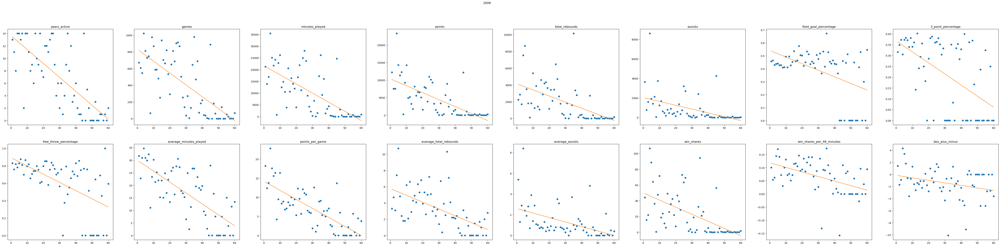

2009


['Jrue Holiday',
 'Patrick Beverley',
 'Marcus Thornton',
 'Chase Budinger',
 'Danny Green',
 'Patty Mills']

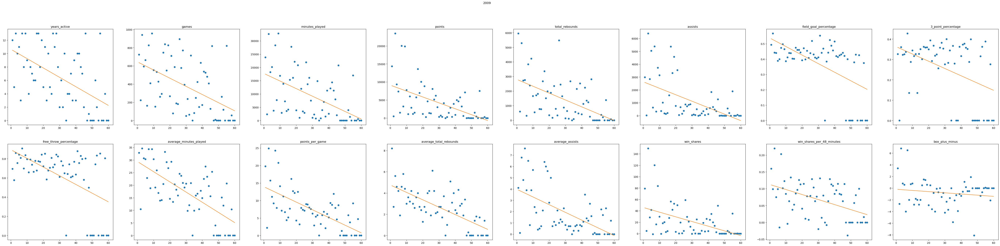

2010


['Eric Bledsoe',
 'Nemanja Bjelica',
 'Landry Fields',
 'Lance Stephenson',
 'Luke Harangody',
 'Willie Warren',
 'Jeremy Evans']

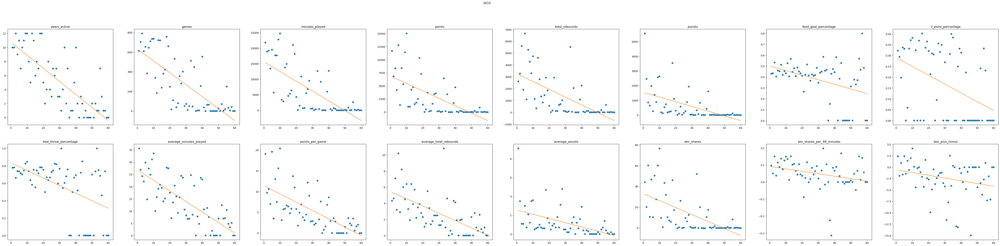

2011


['Kawhi Leonard',
 'Nikola Vučević',
 'Tobias Harris',
 'Jimmy Butler',
 'Bojan Bogdanović',
 'Chandler Parsons',
 "E'Twaun Moore",
 'Isaiah Thomas']

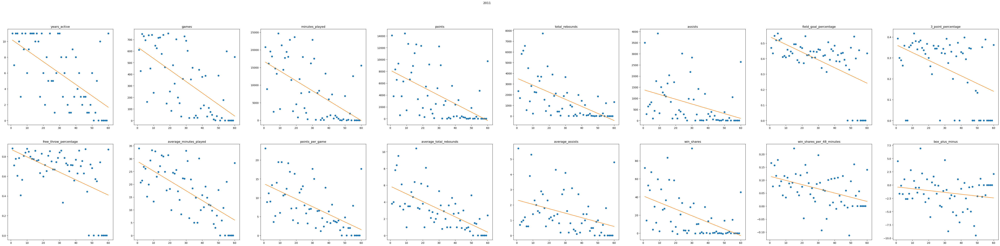

2012


['Jae Crowder',
 'Draymond Green',
 'Khris Middleton',
 'Will Barton',
 "Kyle O'Quinn",
 'Robbie Hummel']

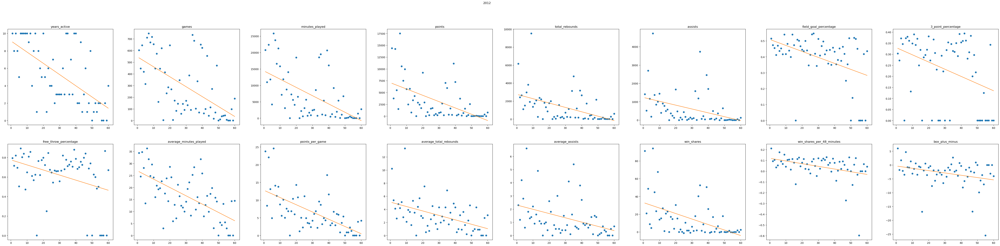

2013


['Mike Muscala', 'Raul Neto', 'James Ennis III', 'Joffrey Lauvergne']

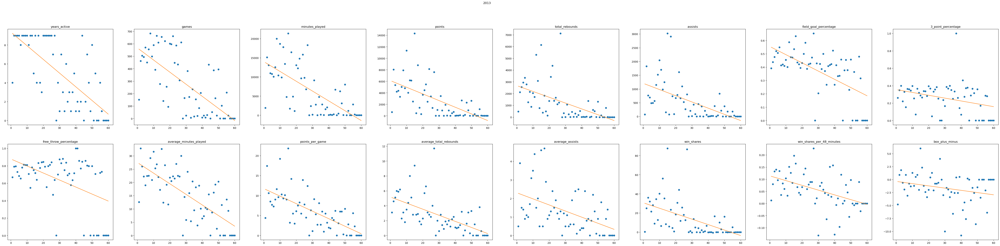

2014


['Joe Harris',
 'Spencer Dinwiddie',
 'Jerami Grant',
 'Nikola Jokić',
 'Dwight Powell',
 'Jordan Clarkson']

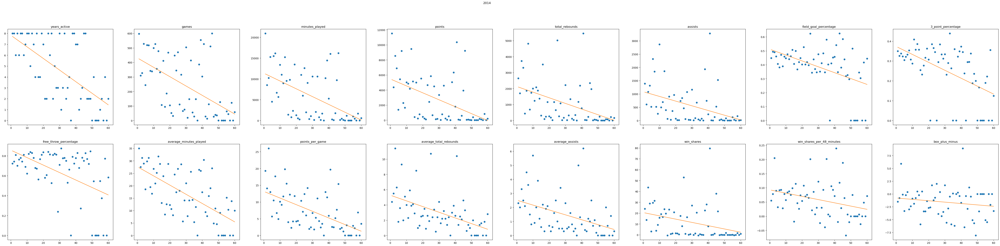

2015


['Larry Nance Jr.',
 'Richaun Holmes',
 'Josh Richardson',
 'Pat Connaughton',
 'Norman Powell']

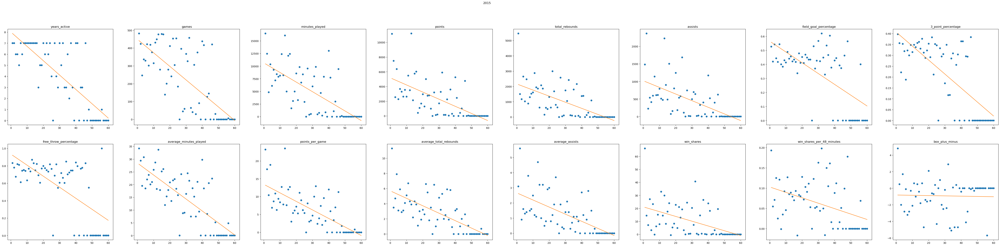

2016


['Caris LeVert',
 'Pascal Siakam',
 'Dejounte Murray',
 'Malcolm Brogdon',
 'Georges Niang',
 'Abdel Nader',
 'Tyrone Wallace']

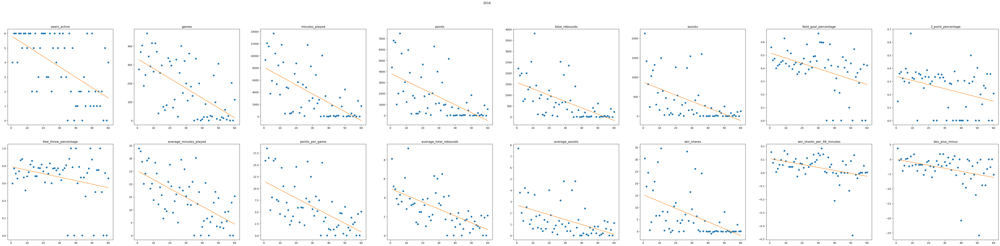

2017


['Derrick White', 'Josh Hart', 'Thomas Bryant', 'Monte Morris']

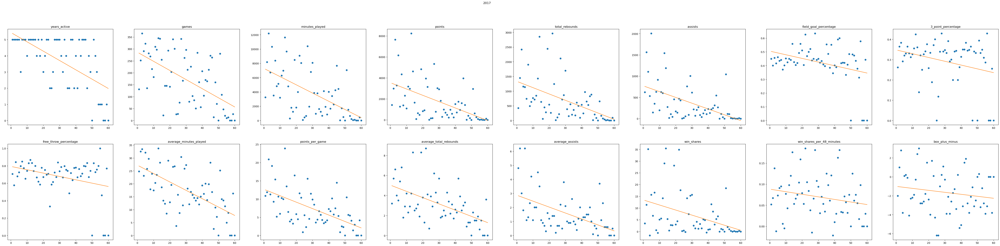

2018


['Bruce Brown', 'Hamidou Diallo', "De'Anthony Melton", 'Shake Milton']

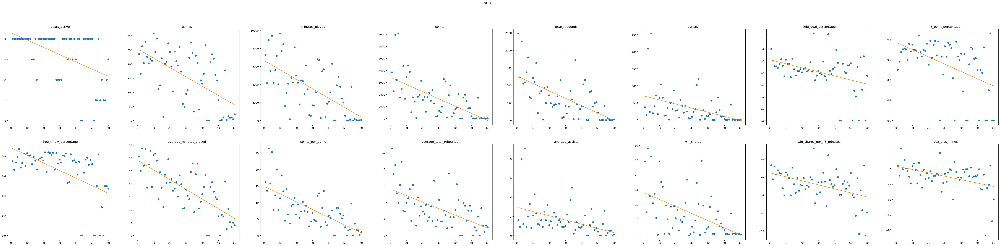

2019


['Keldon Johnson',
 'Eric Paschall',
 'Isaiah Roby',
 'Terance Mann',
 'Jalen McDaniels']

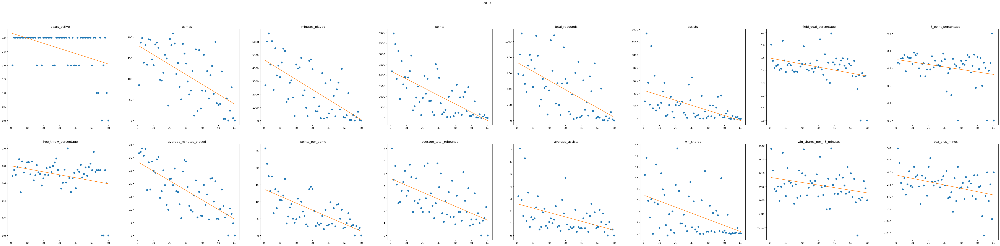

2020


['Desmond Bane', 'Kenyon Martin Jr.', 'Sam Merrill']

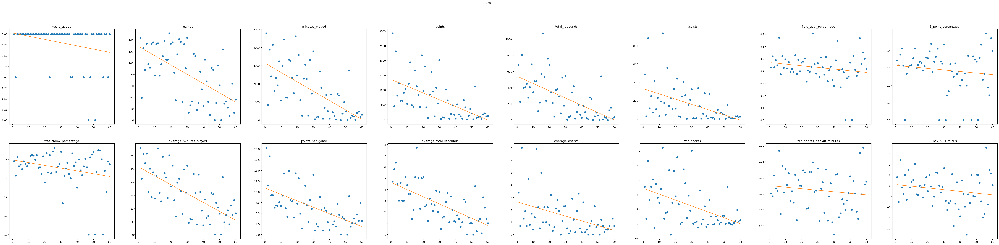

2021


['Herbert Jones', 'Ayo Dosunmu', 'Luka Garza', 'Sandro Mamukelashvili']

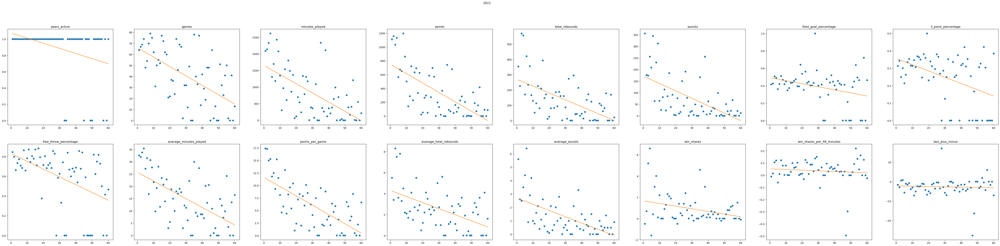

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
0,1,1989,1,1,SAC,Pervis Ellison,Louisville,11.0,474.0,11593.0,4494.0,3170.0,691.0,0.510,0.050,0.689,24.5,9.5,6.7,1.5,21.8,0.090,-0.5,4.4,100.0,,3
1,2,1989,2,2,LAC,Danny Ferry,Duke,13.0,917.0,18133.0,6439.0,2550.0,1185.0,0.446,0.393,0.840,19.8,7.0,2.8,1.3,34.8,0.092,-0.9,4.9,84.9485,,4
2,3,1989,3,3,SAS,Sean Elliott,Arizona,12.0,742.0,24502.0,10544.0,3204.0,1897.0,0.465,0.375,0.799,33.0,14.2,4.3,2.6,55.7,0.109,0.2,13.5,76.143937,,13
3,4,1989,4,4,MIA,Glen Rice,Michigan,15.0,1000.0,34985.0,18336.0,4387.0,2097.0,0.456,0.400,0.846,35.0,18.3,4.4,2.1,88.7,0.122,0.8,24.9,69.897,,14
4,5,1989,5,5,CHH,J.R. Reid,UNC,11.0,672.0,15370.0,5680.0,3381.0,639.0,0.472,0.135,0.716,22.9,8.5,5.0,1.0,22.5,0.070,-2.9,-3.7,65.0515,,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1917,1918,2021,56,56,CHO,Scottie Lewis,Florida,1.0,2.0,7.0,1.0,0.0,1.0,0.000,0.000,0.500,3.5,0.5,0.0,0.5,0.0,0.164,6.0,0.0,12.590599,,7
1918,1919,2021,57,57,CHO,Balša Koprivica,Florida State,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,12.206257,,3
1919,1920,2021,58,58,NYK,Jericho Sims,Texas,1.0,41.0,555.0,90.0,169.0,21.0,0.722,0.000,0.414,13.5,2.2,4.1,0.5,1.5,0.128,-1.7,0.0,11.8286,,15
1920,1921,2021,59,59,BRK,RaiQuan Gray,Florida State,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,11.457399,,4


In [7]:
# Working
NBA_DRAFT['ACTUAL_DRAFT_PICK_RANK'] = 0
NBA_DRAFT['OVERALL_PICK_RANKING'] = ""

for YEAR in NBA_DRAFT['year'].unique():
    # New DF
    NBA_DRAFT_YEAR = NBA_DRAFT[NBA_DRAFT['year'] == YEAR]

    MAX_ACTIVE_YEARS = NBA_DRAFT_YEAR['years_active'].max()
    print(YEAR)


    NBA_COLUMNS = NBA_DRAFT_YEAR.columns.to_list()
    NBA_COLUMNS = NBA_COLUMNS[7:23]
    len_NBA_COLUMNS = len(NBA_COLUMNS)
    ROWS = 2
    COLUMNS = round(len_NBA_COLUMNS/2)
    fig, ax = plt.subplots(ROWS, COLUMNS, figsize=(70, 15))
    plt.suptitle(YEAR)
    i = y = x = 0
    # fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    # fig.tight_layout(pad=3)
    # ax[0].plot(climate_change['date'], climate_change['co2'])
    # ax[1].plot(climate_change['date'], climate_change['relative_temp'])

    # plt.show();
    for COLUMN in NBA_COLUMNS:
        if i == COLUMNS and y == COLUMNS:
            x = 1
            y = 0
        else:
            pass

        # print(x,y)
        # New DF
        NBA_DRAFT_YEAR_COLUMN = NBA_DRAFT_YEAR.copy()
        column_name = COLUMN + '_RANK'
        NBA_DRAFT_YEAR_COLUMN[column_name] = ''
        INDEX = (NBA_COLUMNS.index(COLUMN) + 7)
        STAT_INFO =  NBA_DRAFT_YEAR_COLUMN.iloc[:,INDEX]

        # plt.subplot(ROWS, COLUMNS, (NBA_COLUMNS.index(COLUMN) + 1))
        # plt.plot(NBA_DRAFT_YEAR["overall_pick"], NBA_DRAFT_YEAR_COLUMN[COLUMN], 'o')

        ax[x,y].plot(NBA_DRAFT_YEAR["overall_pick"], NBA_DRAFT_YEAR_COLUMN[COLUMN], 'o')

        ax[x,y].set(title = COLUMN)
        a, b = np.polyfit(NBA_DRAFT_YEAR_COLUMN["overall_pick"], NBA_DRAFT_YEAR_COLUMN[COLUMN], 1)
        NBA_DRAFT_YEAR_COLUMN[column_name] = (a*NBA_DRAFT_YEAR_COLUMN["overall_pick"])+b
        NBA_DRAFT_YEAR_COLUMN['OVERALL_PICK_RANKING'] = NBA_DRAFT_YEAR_COLUMN[COLUMN] - NBA_DRAFT_YEAR_COLUMN[column_name]
        NBA_DRAFT_YEAR_COLUMN['ACTUAL_DRAFT_PICK_RANK'] = np.where((NBA_DRAFT_YEAR_COLUMN['OVERALL_PICK_RANKING'] > 0), NBA_DRAFT_YEAR_COLUMN['ACTUAL_DRAFT_PICK_RANK'] + 1, NBA_DRAFT_YEAR_COLUMN['ACTUAL_DRAFT_PICK_RANK']+ 0)

        ax[x,y].plot(NBA_DRAFT_YEAR["overall_pick"], (a*NBA_DRAFT_YEAR["overall_pick"]+b))  

        NBA_DRAFT_YEAR_COLUMN = NBA_DRAFT_YEAR_COLUMN[['id','year','overall_pick','ACTUAL_DRAFT_PICK_RANK']]


        for ID in NBA_DRAFT_YEAR_COLUMN["id"].to_list():
        # print(ID)
            ID_Ranking_df = NBA_DRAFT_YEAR_COLUMN[NBA_DRAFT_YEAR_COLUMN["id"] == ID]
            ID_Ranking = ID_Ranking_df.iloc[0,3]
            NBA_DRAFT_YEAR.loc[NBA_DRAFT_YEAR["id"] == ID, 'ACTUAL_DRAFT_PICK_RANK'] = ID_Ranking
        i += 1
        y += 1

    # top_pick_ranking = NBA_DRAFT_YEAR['ACTUAL_DRAFT_PICK_RANK'].max()
    top_player_stats = NBA_DRAFT_YEAR[NBA_DRAFT_YEAR['ACTUAL_DRAFT_PICK_RANK'] == NBA_DRAFT_YEAR['ACTUAL_DRAFT_PICK_RANK'].max()]
    top_player_list = top_player_stats['player'].to_list()

    display(top_player_list)
    # top_player = top_player_stats.iloc[0,5]
    # print(top_player)
    NBA_DRAFT_YEAR = NBA_DRAFT_YEAR[['id','year','overall_pick','ACTUAL_DRAFT_PICK_RANK']]



    for ID in NBA_DRAFT_YEAR_COLUMN["id"].to_list():
        # print(ID)
        ID_Ranking_df = NBA_DRAFT_YEAR_COLUMN[NBA_DRAFT_YEAR_COLUMN["id"] == ID]
        ID_Ranking = ID_Ranking_df.iloc[0,3]
        NBA_DRAFT.loc[NBA_DRAFT["id"] == ID, 'ACTUAL_DRAFT_PICK_RANK'] = ID_Ranking

    plt.show()
    
        
display(NBA_DRAFT)


        b. Conditional on the expected value of the draft positions, which NBA teams have over or underperformed the most when drafting during this time span. Which College Teams have had the players outperform expectations the most after entering the NBA?

In [10]:
# First Approach - Only Colleges that overperformed
# NBA_DRAFT_TOP_PROSPECTS = NBA_DRAFT[NBA_DRAFT['ACTUAL_DRAFT_PICK_RANK'] == NBA_DRAFT['ACTUAL_DRAFT_PICK_RANK'].max()].reset_index(drop = True)
# NBA_DRAFT_TOP_PROSPECTS['ACTUAL_DRAFT_PICK_RANK'] = (NBA_DRAFT_TOP_PROSPECTS['ACTUAL_DRAFT_PICK_RANK']// 16) * 100
# NBA_DRAFT_TOP_COLLEGES_PROSPECTS = NBA_DRAFT_TOP_PROSPECTS.groupby(['college']).count().sort_values(['id'], ascending = False).reset_index()
# NBA_DRAFT_TOP_COLLEGES_PROSPECTS = NBA_DRAFT_TOP_COLLEGES_PROSPECTS[(NBA_DRAFT_TOP_COLLEGES_PROSPECTS['id'] > 2)]

# for college in NBA_DRAFT_TOP_COLLEGES_PROSPECTS['college'].to_list():
#     NBA_DRAFT_TOP_COLLEGE_PROSPECTS = NBA_DRAFT_TOP_PROSPECTS[NBA_DRAFT_TOP_PROSPECTS['college'] == college]


#     ROWS = 2
#     COLUMNS = math.ceil(NBA_DRAFT_TOP_COLLEGE_PROSPECTS.shape[0]/2)

#     i = y = x = 0
#     plt.suptitle(college)
#     display(NBA_DRAFT_TOP_COLLEGE_PROSPECTS)

#     ax = NBA_DRAFT_TOP_COLLEGE_PROSPECTS.plot(x = 'player', y = 'ACTUAL_DRAFT_PICK_RANK', kind="bar", rot=0)
#     NBA_DRAFT_TOP_COLLEGE_PROSPECTS.plot(x = 'player', y = "DRAFT_PICK_RANKING", kind="bar", ax=ax, color="C2", rot=0)
#     plt.xticks(rotation='vertical')


#     plt.show()
    



,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
152,153,1991,45,45,MIL,Bobby Phills,Southern University and A&M College,9.0,467.0,13426.0,5153.0,1469.0,1246.0,0.443,0.390,0.738,28.7,11.0,3.1,2.7,27.2,0.097,0.2,7.5,17.339374,82.660626,100.00
315,316,1994,46,46,MIL,Voshon Lenard,Minnesota,11.0,565.0,15349.0,6745.0,1609.0,1180.0,0.415,0.384,0.787,27.2,11.9,2.8,2.1,29.6,0.093,0.0,7.9,16.862108,83.137892,100.00
366,367,1995,43,43,MIL,Eric Snow,Michigan State,13.0,846.0,23132.0,5791.0,2141.0,4245.0,0.424,0.208,0.763,27.3,6.8,2.5,5.0,43.4,0.090,-1.0,5.9,18.326577,81.673423,100.00
535,536,1998,39,39,MIL,Rafer Alston,Fresno State,11.0,671.0,19392.0,6799.0,1891.0,3202.0,0.383,0.354,0.729,28.9,10.1,2.8,4.8,32.9,0.081,0.0,9.6,20.44677,73.30323,93.75
655,656,2000,43,43,MIL,Michael Redd,Ohio State,12.0,629.0,20104.0,11972.0,2411.0,1338.0,0.447,0.380,0.838,32.0,19.0,3.8,2.1,55.9,0.134,2.2,21.4,18.326577,81.673423,100.00
661,662,2000,49,49,MIL,Jason Hart,Syracuse,9.0,341.0,5289.0,1623.0,567.0,774.0,0.417,0.315,0.788,15.5,4.8,1.7,2.3,8.6,0.078,-1.2,1.0,15.490196,84.509804,100.00
827,828,2003,43,43,MIL,Keith Bogans,Kentucky,11.0,671.0,14527.0,4257.0,1817.0,866.0,0.394,0.353,0.716,21.6,6.3,2.7,1.3,20.4,0.068,-1.5,1.9,18.326577,81.673423,100.00
937,938,2005,36,36,MIL,Ersan İlyasova,0,13.0,825.0,18957.0,8364.0,4661.0,908.0,0.443,0.367,0.777,23.0,10.1,5.6,1.1,48.8,0.124,-0.1,9.0,22.184875,71.565125,93.75
1077,1078,2007,56,56,MIL,Ramon Sessions,Nevada,11.0,691.0,16119.0,7141.0,1840.0,2807.0,0.434,0.316,0.791,23.3,10.3,2.7,4.1,28.8,0.086,-0.7,5.2,12.590599,87.409401,100.00
1182,1183,2009,41,41,MIL,Jodie Meeks,Kentucky,10.0,539.0,12110.0,4988.0,1120.0,583.0,0.420,0.373,0.879,22.5,9.3,2.1,1.1,24.3,0.096,-0.6,4.2,19.360807,74.389193,93.75


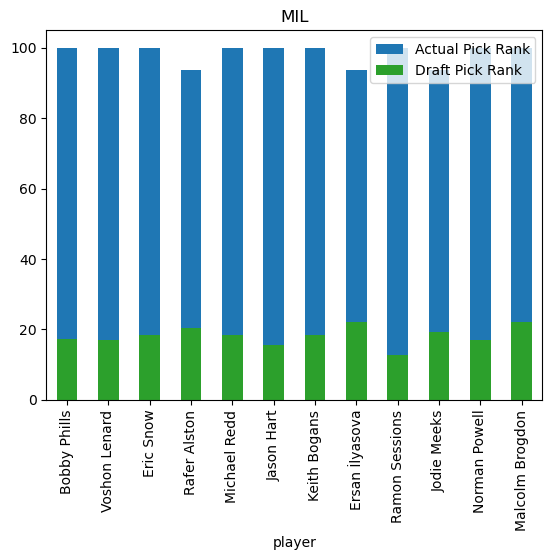

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
25,26,1989,26,26,LAL,Vlade Divac,0,16.0,1134.0,33838.0,13398.0,9326.0,3541.0,0.495,0.235,0.692,29.8,11.8,8.2,3.1,96.4,0.137,2.3,36.3,29.251333,70.748667,100.00
104,105,1990,51,51,LAL,Tony Smith,Marquette,9.0,457.0,7295.0,2504.0,735.0,881.0,0.431,0.307,0.690,16.0,5.5,1.6,1.9,6.7,0.044,-2.0,0.0,14.621491,79.128509,93.75
252,253,1993,37,37,LAL,Nick Van Exel,Cincinnati,13.0,880.0,28969.0,12658.0,2545.0,5777.0,0.405,0.357,0.794,32.9,14.4,2.9,6.6,55.9,0.093,0.4,17.7,21.589914,78.410086,100.00
490,491,1997,51,51,LAL,DeJuan Wheat,Louisville,2.0,80.0,740.0,265.0,56.0,127.0,0.383,0.390,0.700,9.3,3.3,0.7,1.6,0.5,0.034,-1.9,0.0,14.621491,79.128509,93.75
1069,1070,2007,48,48,LAL,Marc Gasol,0,13.0,891.0,28719.0,12514.0,6604.0,2996.0,0.481,0.360,0.776,32.2,14.0,7.4,3.4,85.3,0.143,3.1,36.5,15.937938,84.062062,100.00
1139,1140,2008,58,58,LAL,Joe Crawford,Kentucky,1.0,2.0,23.0,9.0,4.0,1.0,0.300,0.250,1.000,11.5,4.5,2.0,0.5,0.0,0.037,-2.7,0.0,11.8286,75.6714,87.50
1183,1184,2009,42,42,LAL,Patrick Beverley,Arkansas,10.0,526.0,14411.0,4654.0,2243.0,1839.0,0.414,0.378,0.756,27.4,8.8,4.3,3.5,34.5,0.115,1.1,11.4,18.837535,81.162465,100.00
1259,1260,2010,58,58,LAL,Derrick Caracter,Texas-El Paso,1.0,41.0,215.0,81.0,43.0,7.0,0.485,0.000,0.739,5.2,2.0,1.0,0.2,0.3,0.057,-7.1,-0.3,11.8286,75.6714,87.50
1381,1382,2012,60,60,LAL,Robert Sacre,Gonzaga,4.0,189.0,2745.0,787.0,593.0,126.0,0.436,0.000,0.671,14.5,4.2,3.1,0.7,2.4,0.042,-4.0,-1.4,11.092437,82.657563,93.75
1429,1430,2013,48,48,LAL,Ryan Kelly,Duke,4.0,163.0,3125.0,981.0,504.0,215.0,0.378,0.316,0.797,19.2,6.0,3.1,1.3,3.0,0.046,-2.6,-0.5,15.937938,71.562062,87.50


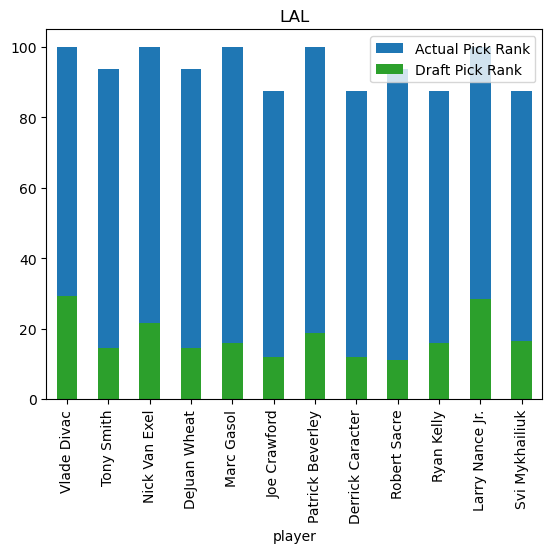

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
155,156,1991,48,48,UTA,Isaac Austin,Arizona State,9.0,432.0,8350.0,3285.0,2030.0,538.0,0.446,0.176,0.670,19.3,7.6,4.7,1.2,9.2,0.053,-2.5,-1.0,15.937938,77.812062,93.75
260,261,1993,45,45,UTA,Bryon Russell,Cal State Long Beach,13.0,841.0,19805.0,6663.0,2914.0,1085.0,0.431,0.369,0.750,23.5,7.9,3.5,1.3,47.4,0.115,0.4,11.8,17.339374,82.660626,100.00
316,317,1994,47,47,UTA,Jamie Watson,South Carolina,4.0,102.0,1248.0,323.0,149.0,117.0,0.468,0.316,0.694,12.2,3.2,1.5,1.1,1.2,0.045,-1.5,0.2,16.395107,83.604893,100.00
435,436,1996,54,54,UTA,Shandon Anderson,Georgia,10.0,719.0,15946.0,5327.0,2252.0,1007.0,0.457,0.316,0.739,22.2,7.4,3.1,1.4,23.6,0.071,-1.3,3.0,13.380312,86.619688,100.00
722,723,2001,53,53,UTA,Jarron Collins,Stanford,10.0,542.0,8542.0,2095.0,1579.0,419.0,0.455,0.000,0.699,15.8,3.9,2.9,0.8,15.7,0.088,-3.1,-2.5,13.786207,73.713793,87.50
831,832,2003,47,47,UTA,Mo Williams,Alabama,13.0,818.0,23872.0,10759.0,2264.0,3990.0,0.434,0.378,0.871,29.2,13.2,2.8,4.9,40.0,0.080,-0.3,10.0,16.395107,83.604893,100.00
1008,1009,2006,47,47,UTA,Paul Millsap,Louisiana Tech,16.0,1085.0,30499.0,14536.0,7673.0,2378.0,0.489,0.341,0.736,28.1,13.4,7.1,2.2,95.4,0.150,1.9,29.9,16.395107,83.604893,100.00
1256,1257,2010,55,55,UTA,Jeremy Evans,Western Kentucky,7.0,250.0,2626.0,879.0,641.0,107.0,0.569,0.231,0.687,10.5,3.5,2.6,0.4,8.2,0.150,0.9,1.9,12.981866,87.018134,100.00
1621,1622,2016,60,60,UTA,Tyrone Wallace,California,4.0,112.0,1714.0,566.0,236.0,127.0,0.422,0.207,0.656,15.3,5.1,2.1,1.1,0.1,0.003,-5.2,-1.4,11.092437,88.907563,100.00
1651,1652,2017,30,30,UTA,Josh Hart,Villanova,5.0,296.0,8071.0,2918.0,1701.0,614.0,0.450,0.347,0.739,27.3,9.9,5.7,2.1,15.7,0.094,-0.3,3.4,26.143937,73.856063,100.00


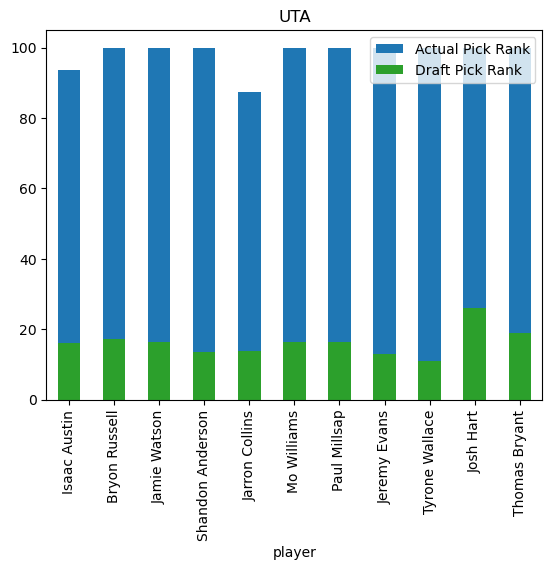

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
156,157,1991,49,49,SAS,Greg Sutton,Oral Roberts,3.0,168.0,1946.0,761.0,153.0,284.0,0.396,0.361,0.743,11.6,4.5,0.9,1.7,1.0,0.024,-3.6,-0.8,15.490196,72.009804,87.50
262,263,1993,47,47,SAS,Chris Whitney,Clemson,11.0,579.0,10052.0,3738.0,815.0,1613.0,0.395,0.361,0.875,17.4,6.5,1.4,2.8,21.2,0.101,-0.2,4.6,16.395107,83.604893,100.00
611,612,1999,57,57,SAS,Manu Ginóbili,0,16.0,1057.0,26859.0,14043.0,3697.0,4001.0,0.447,0.369,0.827,25.4,13.3,3.5,3.8,106.4,0.190,5.0,47.6,12.206257,87.793743,100.00
753,754,2002,26,26,SAS,John Salmons,Miami (FL),13.0,895.0,23672.0,8292.0,2603.0,2183.0,0.431,0.366,0.799,26.4,9.3,2.9,2.4,33.9,0.069,-0.9,6.7,29.251333,70.748667,100.00
782,783,2002,56,56,SAS,Luis Scola,0,10.0,743.0,19001.0,8882.0,4941.0,1194.0,0.493,0.339,0.740,25.6,12.0,6.7,1.6,45.7,0.115,-0.7,6.4,12.590599,87.409401,100.00
1126,1127,2008,45,45,SAS,Goran Dragić,0,14.0,888.0,24734.0,12203.0,2735.0,4254.0,0.460,0.362,0.767,27.9,13.7,3.1,4.8,56.3,0.109,0.6,16.3,17.339374,82.660626,100.00
1499,1500,2014,58,58,SAS,Jordan McRae,Tennessee,4.0,123.0,1696.0,846.0,225.0,167.0,0.417,0.355,0.772,13.8,6.9,1.8,1.4,1.7,0.048,-2.1,0.0,11.8286,81.9214,93.75
1590,1591,2016,29,29,SAS,Dejounte Murray,Washington,5.0,320.0,8257.0,3993.0,1920.0,1540.0,0.455,0.330,0.771,25.8,12.5,6.0,4.8,16.4,0.096,1.8,7.8,26.8801,73.1199,100.00
1650,1651,2017,29,29,SAS,Derrick White,Colorado,5.0,263.0,6807.0,3027.0,864.0,1006.0,0.442,0.340,0.838,25.9,11.5,3.3,3.8,15.3,0.108,1.1,5.3,26.8801,73.1199,100.00
1730,1731,2018,49,49,SAS,Chimezie Metu,USC,4.0,143.0,2017.0,869.0,516.0,111.0,0.463,0.308,0.762,14.1,6.1,3.6,0.8,2.1,0.050,-2.3,-0.2,15.490196,72.009804,87.50


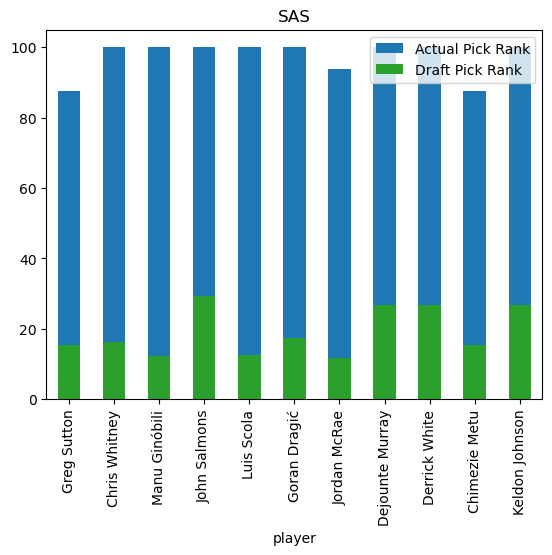

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
0,1,1989,1,1,SAC,Pervis Ellison,Louisville,11.0,474.0,11593.0,4494.0,3170.0,691.0,0.510,0.050,0.689,24.5,9.5,6.7,1.5,21.8,0.090,-0.5,4.4,100.0,-81.25,18.75
93,94,1990,40,40,SAC,Bimbo Coles,Virginia Tech,14.0,852.0,20319.0,6628.0,1820.0,3313.0,0.425,0.267,0.811,23.8,7.8,2.1,3.9,27.4,0.065,-1.6,1.9,19.897,73.853,93.75
267,268,1993,52,52,SAC,Mike Peplowski,Michigan State,3.0,68.0,705.0,194.0,176.0,26.0,0.556,0.000,0.531,10.4,2.9,2.6,0.4,1.0,0.067,-4.5,-0.4,14.199833,73.300167,87.50
304,305,1994,35,35,SAC,Michael Smith,Providence,7.0,449.0,10552.0,2527.0,3193.0,661.0,0.538,0.143,0.529,23.5,5.6,7.1,1.5,23.4,0.107,-0.1,5.1,22.796598,70.953402,93.75
320,321,1994,51,51,SAC,Lawrence Funderburke,Ohio State,7.0,318.0,4726.0,2031.0,1142.0,183.0,0.506,0.118,0.675,14.9,6.4,3.6,0.6,12.9,0.131,-0.5,1.8,14.621491,85.378509,100.00
370,371,1995,47,47,SAC,Tyus Edney,UCLA,4.0,226.0,4743.0,1728.0,393.0,910.0,0.405,0.322,0.806,21.0,7.6,1.7,4.0,6.8,0.068,-1.5,0.7,16.395107,83.604893,100.00
478,479,1997,39,39,SAC,Anthony Johnson,College of Charleston,13.0,793.0,15552.0,4432.0,1358.0,2274.0,0.414,0.356,0.745,19.6,5.6,1.7,2.9,23.2,0.072,-1.5,2.0,20.44677,79.55323,100.00
868,869,2004,26,26,SAC,Kevin Martin,Western Carolina University,12.0,714.0,21559.0,12396.0,2278.0,1352.0,0.437,0.384,0.870,30.2,17.4,3.2,1.9,61.3,0.137,1.0,16.1,29.251333,70.748667,100.00
1321,1322,2011,60,60,SAC,Isaiah Thomas,Washington,11.0,550.0,15563.0,9715.0,1321.0,2638.0,0.434,0.362,0.872,28.3,17.7,2.4,4.8,45.3,0.140,2.1,16.1,11.092437,88.907563,100.00
1683,1684,2018,2,2,SAC,Marvin Bagley III,Duke,4.0,166.0,4159.0,2256.0,1224.0,151.0,0.501,0.291,0.663,25.1,13.6,7.4,0.9,7.3,0.085,-2.1,-0.1,84.9485,-72.4485,12.50


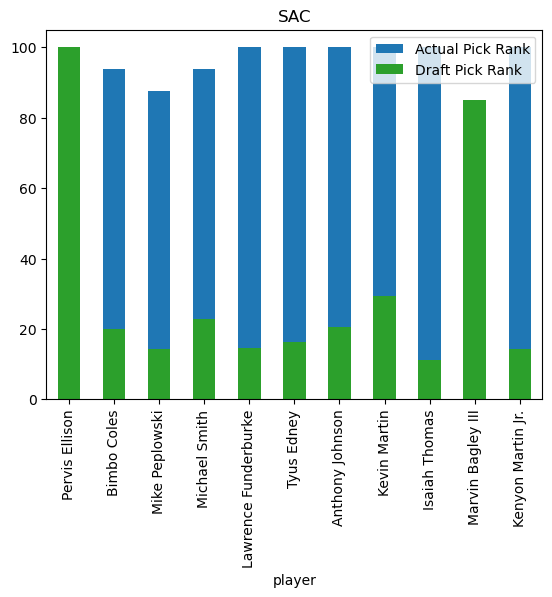

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
100,101,1990,47,47,PHI,Derek Strong,Xavier,10.0,456.0,8548.0,3088.0,2213.0,291.0,0.430,0.180,0.786,18.7,6.8,4.9,0.6,18.5,0.104,-2.1,-0.3,16.395107,77.354893,93.75
429,430,1996,48,48,PHI,Jamie Feick,Michigan State,5.0,201.0,4316.0,911.0,1437.0,139.0,0.424,0.400,0.629,21.5,4.5,7.1,0.7,8.2,0.091,-2.7,-0.7,15.937938,77.812062,93.75
601,602,1999,47,47,PHI,Todd MacCulloch,Washington,4.0,223.0,3439.0,1369.0,888.0,121.0,0.541,0.000,0.642,15.4,6.1,4.0,0.5,11.9,0.166,0.3,2.0,16.395107,77.354893,93.75
946,947,2005,45,45,PHI,Lou Williams,0,17.0,1123.0,27104.0,15593.0,2484.0,3789.0,0.419,0.351,0.842,24.1,13.9,2.2,3.4,65.7,0.116,1.4,23.2,17.339374,76.410626,93.75
1311,1312,2011,50,50,PHI,Lavoy Allen,Temple,6.0,388.0,6905.0,1847.0,1843.0,384.0,0.471,0.133,0.682,17.8,4.8,4.8,1.0,13.8,0.096,-2.1,-0.1,15.0515,72.4485,87.50
1480,1481,2014,39,39,PHI,Jerami Grant,Syracuse,8.0,555.0,14454.0,6329.0,2189.0,747.0,0.452,0.349,0.723,26.0,11.4,3.9,1.3,28.1,0.093,-0.4,5.7,20.44677,79.55323,100.00
1536,1537,2015,35,35,PHI,Willy Hernangómez,0,6.0,306.0,4691.0,2262.0,1802.0,331.0,0.534,0.309,0.702,15.3,7.4,5.9,1.1,14.6,0.150,0.1,2.5,22.796598,70.953402,93.75
1538,1539,2015,37,37,PHI,Richaun Holmes,Bowling Green,7.0,376.0,7923.0,3605.0,2167.0,403.0,0.605,0.256,0.746,21.1,9.6,5.8,1.1,26.6,0.161,0.4,4.8,21.589914,78.410086,100.00
1622,1623,2017,1,1,PHI,Markelle Fultz,Washington,5.0,131.0,3251.0,1423.0,425.0,623.0,0.450,0.262,0.708,24.8,10.9,3.2,4.8,3.5,0.052,-2.0,0.0,100.0,-93.75,6.25
1667,1668,2017,46,46,PHI,Sterling Brown,SMU,5.0,264.0,4434.0,1431.0,883.0,266.0,0.420,0.364,0.796,16.8,5.4,3.3,1.0,6.5,0.071,-2.1,-0.1,16.862108,76.887892,93.75


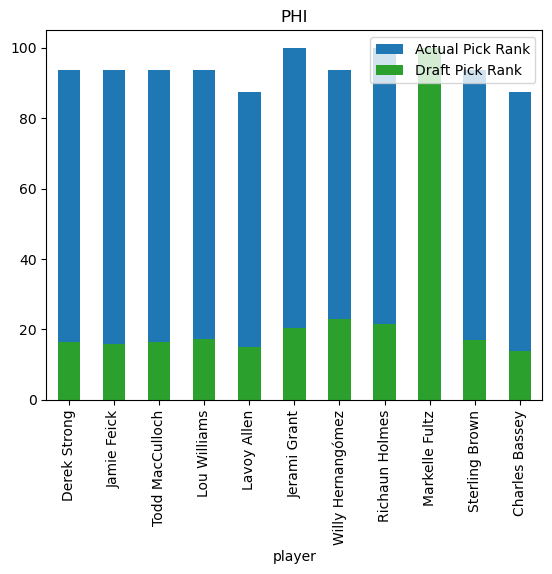

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
381,382,1995,58,58,DET,Don Reid,Georgetown,8.0,403.0,5374.0,1454.0,1169.0,143.0,0.530,0.000,0.658,13.3,3.6,2.9,0.4,13.7,0.123,-2.1,-0.2,11.8286,75.6714,87.5
656,657,2000,44,44,DET,Brian Cardinal,Purdue,12.0,456.0,6477.0,2108.0,1050.0,465.0,0.408,0.372,0.861,14.2,4.6,2.3,1.0,15.4,0.114,-0.1,3.2,17.827366,82.172634,100.0
707,708,2001,38,38,DET,Mehmet Okur,0,10.0,634.0,18429.0,8561.0,4436.0,1089.0,0.458,0.375,0.797,29.1,13.5,7.0,1.7,54.7,0.142,1.1,14.5,21.01082,78.98918,100.0
786,787,2003,2,2,DET,Darko Miličić,0,10.0,468.0,8638.0,2813.0,1971.0,405.0,0.460,0.000,0.574,18.5,6.0,4.2,0.9,7.1,0.040,-2.4,-0.9,84.9485,-84.9485,0.0
957,958,2005,56,56,DET,Amir Johnson,0,14.0,870.0,18323.0,6102.0,4692.0,1073.0,0.570,0.332,0.673,21.1,7.0,5.4,1.2,55.3,0.145,0.3,10.6,12.590599,87.409401,100.0
1185,1186,2009,44,44,DET,Chase Budinger,Arizona,7.0,407.0,7998.0,3198.0,1240.0,473.0,0.430,0.352,0.797,19.7,7.9,3.0,1.2,13.9,0.083,-0.5,2.9,17.827366,82.172634,100.0
1360,1361,2012,39,39,DET,Khris Middleton,Texas A&M,10.0,651.0,20692.0,11136.0,3166.0,2461.0,0.458,0.392,0.881,31.8,17.1,4.9,3.8,50.6,0.117,0.7,14.3,20.44677,79.55323,100.0
1479,1480,2014,38,38,DET,Spencer Dinwiddie,Colorado,8.0,387.0,10206.0,5042.0,1167.0,1933.0,0.411,0.322,0.791,26.4,13.0,3.0,5.0,22.5,0.106,0.3,6.0,21.01082,78.98918,100.0
1723,1724,2018,42,42,DET,Bruce Brown,Miami (FL),4.0,269.0,6308.0,2056.0,1153.0,573.0,0.482,0.327,0.745,23.4,7.6,4.3,2.1,12.7,0.097,-0.9,1.7,18.837535,81.162465,100.0
1786,1787,2019,45,45,DET,Isaiah Roby,Nebraska,3.0,109.0,2384.0,987.0,560.0,178.0,0.495,0.365,0.708,21.9,9.1,5.1,1.6,4.1,0.083,-1.8,0.1,17.339374,82.660626,100.0


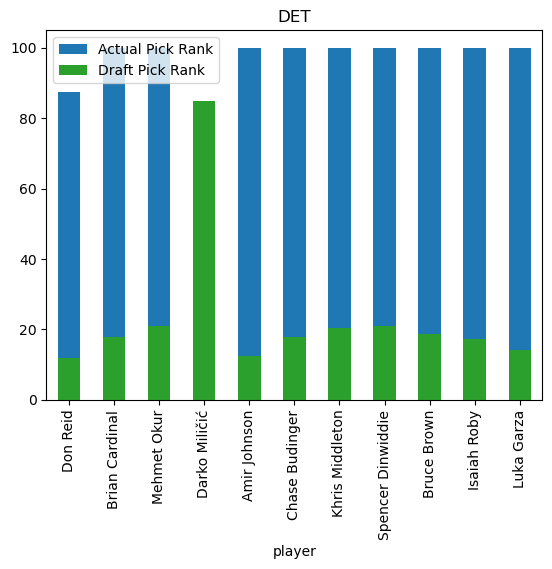

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
98,99,1990,45,45,IND,Antonio Davis,Texas-El Paso,13.0,903.0,26084.0,9041.0,6755.0,1017.0,0.448,0.087,0.727,28.9,10.0,7.5,1.1,59.6,0.110,-1.3,4.4,17.339374,76.410626,93.75
375,376,1995,52,52,IND,Fred Hoiberg,Iowa State,10.0,541.0,9978.0,2944.0,1438.0,846.0,0.431,0.396,0.854,18.4,5.4,2.7,1.6,27.6,0.133,1.2,8.0,14.199833,85.800167,100.00
433,434,1996,52,52,IND,Mark Pope,Kentucky,6.0,153.0,1634.0,285.0,261.0,63.0,0.401,0.179,0.573,10.7,1.9,1.7,0.4,1.3,0.038,-4.3,-0.9,14.199833,79.550167,93.75
833,834,2003,49,49,IND,James Jones,Miami (FL),14.0,709.0,11098.0,3717.0,1276.0,366.0,0.401,0.401,0.840,15.7,5.2,1.8,0.5,25.2,0.109,-0.1,5.4,15.490196,78.259804,93.75
1193,1194,2009,52,52,IND,A.J. Price,UConn,6.0,261.0,3929.0,1523.0,377.0,567.0,0.380,0.316,0.742,15.1,5.8,1.4,2.2,4.7,0.058,-1.3,0.7,14.199833,79.550167,93.75
1241,1242,2010,40,40,IND,Lance Stephenson,Cincinnati,10.0,554.0,12680.0,4738.0,2251.0,1621.0,0.445,0.314,0.694,22.9,8.6,4.1,2.9,17.5,0.066,-1.3,2.3,19.897,80.103,100.00
1258,1259,2010,57,57,IND,Ryan Reid,Florida State,1.0,5.0,17.0,8.0,2.0,0.0,0.800,0.000,0.000,3.4,1.6,0.4,0.0,0.1,0.142,-2.0,0.0,12.206257,75.293743,87.50
1611,1612,2016,50,50,IND,Georges Niang,Iowa State,6.0,305.0,4454.0,1857.0,619.0,248.0,0.437,0.404,0.873,14.6,6.1,2.0,0.8,8.1,0.088,-1.1,1.0,15.0515,84.9485,100.00
1915,1916,2021,54,54,IND,Sandro Mamukelashvili,Seton Hall,1.0,41.0,407.0,154.0,82.0,22.0,0.496,0.423,0.818,9.9,3.8,2.0,0.5,1.1,0.135,-0.3,0.2,13.380312,86.619688,100.00


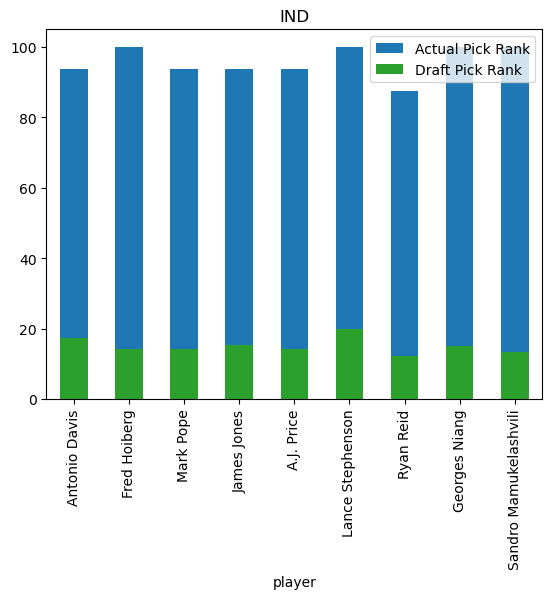

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
203,204,1992,42,42,MIA,Matt Geiger,Georgia Tech,10.0,552.0,12221.0,5059.0,3158.0,388.0,0.499,0.232,0.728,22.1,9.2,5.7,0.7,28.4,0.112,-1.8,0.6,18.837535,74.912465,93.75
607,608,1999,53,53,MIA,Rodney Buford,Creighton,5.0,230.0,4182.0,1472.0,598.0,179.0,0.412,0.300,0.758,18.2,6.4,2.6,0.8,2.9,0.033,-3.8,-1.9,13.786207,79.963793,93.75
649,650,2000,37,37,MIA,Eddie House,Arizona State,11.0,717.0,12405.0,5356.0,1223.0,1112.0,0.409,0.390,0.851,17.3,7.5,1.7,1.6,20.0,0.077,0.0,6.1,21.589914,72.160086,93.75
779,780,2002,53,53,MIA,Rasual Butler,La Salle,13.0,809.0,17219.0,6092.0,1934.0,658.0,0.403,0.362,0.747,21.3,7.5,2.4,0.8,20.8,0.058,-1.4,2.6,13.786207,86.213793,100.00
895,896,2004,53,53,MIA,Matt Freije,Vanderbilt,2.0,42.0,588.0,133.0,85.0,27.0,0.293,0.224,0.714,14.0,3.2,2.0,0.6,-0.6,-0.047,-6.0,-0.6,13.786207,73.713793,87.50
1083,1084,2008,2,2,MIA,Michael Beasley,Kansas State,11.0,609.0,13903.0,7568.0,2861.0,788.0,0.465,0.349,0.759,22.8,12.4,4.7,1.3,15.6,0.054,-1.7,0.9,84.9485,-84.9485,0.00
1184,1185,2009,43,43,MIA,Marcus Thornton,LSU,8.0,483.0,11299.0,5750.0,1348.0,677.0,0.425,0.358,0.830,23.4,11.9,2.8,1.4,20.0,0.085,0.2,6.2,18.326577,81.673423,100.00
1292,1293,2011,31,31,MIA,Bojan Bogdanović,0,8.0,603.0,17519.0,9043.0,2184.0,945.0,0.457,0.392,0.861,29.1,15.0,3.6,1.6,33.0,0.090,-0.9,4.8,25.431915,74.568085,100.00
1541,1542,2015,40,40,MIA,Josh Richardson,Tennessee,7.0,438.0,13032.0,5270.0,1377.0,1172.0,0.428,0.365,0.839,29.8,12.0,3.1,2.7,23.8,0.088,-0.4,5.2,19.897,80.103,100.00


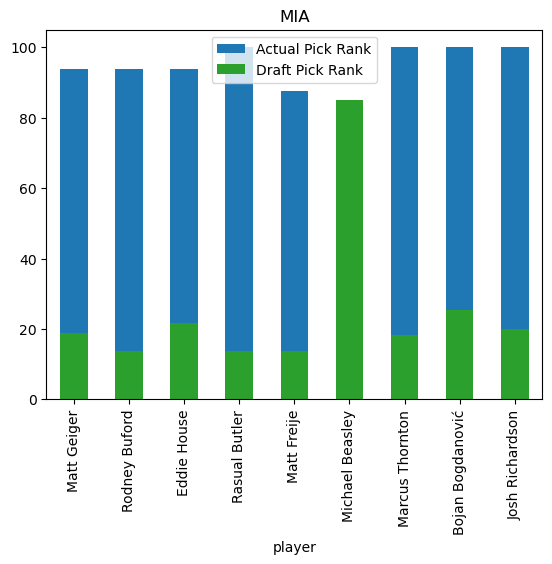

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
206,207,1992,45,45,SEA,Chris King,Wake Forest,3.0,103.0,2058.0,693.0,311.0,116.0,0.423,0.383,0.633,20.0,6.7,3.0,1.1,1.0,0.023,-2.8,-0.4,17.339374,82.660626,100.00
323,324,1994,54,54,SEA,Željko Rebrača,0,5.0,215.0,3280.0,1276.0,688.0,88.0,0.527,0.000,0.792,15.3,5.9,3.2,0.4,8.3,0.121,-2.2,-0.2,13.380312,80.369688,93.75
438,439,1996,57,57,SEA,Drew Barry,Georgia Tech,3.0,60.0,598.0,134.0,67.0,111.0,0.417,0.381,0.774,10.0,2.2,1.1,1.9,0.6,0.051,-3.5,-0.2,12.206257,81.543743,93.75
493,494,1997,54,54,SEA,Mark Blount,Pitt,9.0,605.0,13981.0,4941.0,2784.0,513.0,0.504,0.359,0.723,23.1,8.2,4.6,0.8,18.8,0.065,-2.7,-2.5,13.380312,80.369688,93.75
528,529,1998,32,32,SEA,Rashard Lewis,0,16.0,1049.0,33541.0,15579.0,5433.0,1765.0,0.452,0.386,0.805,32.0,14.9,5.2,1.7,90.9,0.130,1.9,33.1,24.742501,75.257499,100.00
709,710,2001,40,40,SEA,Earl Watson,UCLA,13.0,878.0,19494.0,5593.0,1985.0,3871.0,0.411,0.324,0.703,22.2,6.4,2.3,4.4,19.2,0.047,-1.4,2.8,19.897,80.103,100.00
711,712,2001,42,42,SEA,Bobby Simmons,DePaul,10.0,466.0,11513.0,4189.0,1791.0,710.0,0.437,0.396,0.823,24.7,9.0,3.8,1.5,20.1,0.084,-0.7,3.6,18.837535,81.162465,100.00
825,826,2003,41,41,SEA,Willie Green,Detroit Mercy,12.0,731.0,14783.0,6059.0,1303.0,1018.0,0.425,0.346,0.765,20.2,8.3,1.8,1.4,12.9,0.042,-2.7,-2.7,19.360807,80.639193,100.00


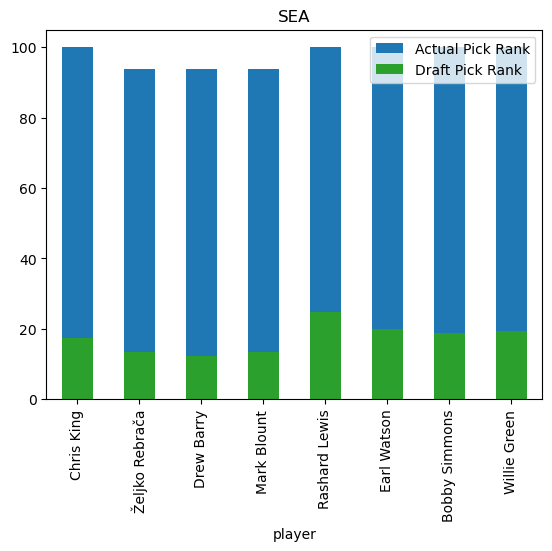

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
51,52,1989,52,52,PHO,Greg Grant,Trenton State University,6.0,274.0,3350.0,767.0,248.0,751.0,0.383,0.281,0.710,12.2,2.8,0.9,2.7,1.6,0.023,-2.9,-0.8,14.199833,73.300167,87.50
101,102,1990,48,48,PHO,Cedric Ceballos,Cal State Fullerton,11.0,609.0,14712.0,8693.0,3258.0,723.0,0.500,0.309,0.753,24.2,14.3,5.3,1.2,40.4,0.132,0.7,10.1,15.937938,84.062062,100.00
153,154,1991,46,46,PHO,Richard Dumas,Oklahoma State,3.0,102.0,2226.0,1080.0,351.0,111.0,0.509,0.231,0.694,21.8,10.6,3.4,1.1,4.5,0.097,-0.2,1.0,16.862108,83.137892,100.00
321,322,1994,52,52,PHO,Anthony Goldwire,Houston,8.0,266.0,4951.0,1667.0,359.0,737.0,0.407,0.386,0.792,18.6,6.3,1.3,2.8,6.4,0.062,-1.8,0.3,14.199833,85.800167,100.00
379,380,1995,56,56,PHO,Chris Carr,Southern Illinois,6.0,297.0,4505.0,1988.0,658.0,294.0,0.416,0.338,0.807,15.2,6.7,2.2,1.0,3.9,0.042,-3.0,-1.1,12.590599,87.409401,100.00
481,482,1997,42,42,PHO,Stephen Jackson,Butler County Community College,14.0,858.0,27398.0,12976.0,3328.0,2634.0,0.414,0.333,0.798,31.9,15.1,3.9,3.1,36.1,0.063,-0.4,11.2,18.837535,81.162465,100.00
958,959,2005,57,57,PHO,Marcin Gortat,0,12.0,806.0,20691.0,7951.0,6407.0,915.0,0.551,0.150,0.680,25.7,9.9,7.9,1.1,61.3,0.142,0.4,12.7,12.206257,81.543743,93.75
1080,1081,2007,59,59,PHO,D.J. Strawberry,Maryland,1.0,33.0,270.0,73.0,28.0,30.0,0.315,0.240,0.474,8.2,2.2,0.8,0.9,-0.2,-0.031,-5.6,-0.2,11.457399,76.042601,87.50


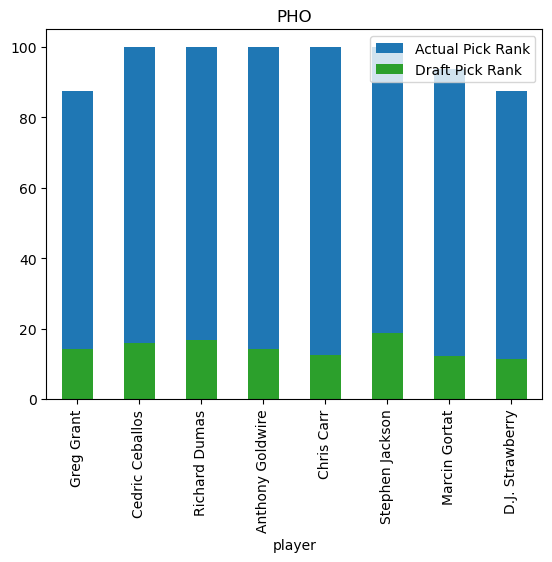

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
37,38,1989,38,38,MIN,Doug West,Villanova,12.0,676.0,16649.0,6477.0,1670.0,1292.0,0.481,0.191,0.801,24.6,9.6,2.5,1.9,17.7,0.051,-3.0,-4.2,21.01082,72.73918,93.75
371,372,1995,48,48,MIN,Mark Davis,Texas Tech,5.0,230.0,3681.0,1261.0,697.0,294.0,0.442,0.246,0.655,16.0,5.5,3.0,1.3,2.3,0.030,-2.4,-0.4,15.937938,84.062062,100.00
372,373,1995,49,49,MIN,Jerome Allen,Penn,2.0,117.0,1305.0,336.0,123.0,201.0,0.350,0.317,0.630,11.2,2.9,1.1,1.7,0.2,0.006,-3.2,-0.4,15.490196,78.259804,93.75
1257,1258,2010,56,56,MIN,Hamady N'Diaye,Rutgers University,3.0,33.0,157.0,20.0,25.0,3.0,0.467,0.000,0.462,4.8,0.6,0.8,0.1,0.0,0.013,-7.3,-0.2,12.590599,74.909401,87.50
1263,1264,2011,2,2,MIN,Derrick Williams,Arizona,7.0,428.0,8864.0,3809.0,1693.0,293.0,0.434,0.300,0.710,20.7,8.9,4.0,0.7,14.1,0.076,-1.6,0.8,84.9485,-84.9485,0.00
1379,1380,2012,58,58,MIN,Robbie Hummel,Purdue,2.0,98.0,1397.0,379.0,266.0,50.0,0.418,0.343,0.867,14.3,3.9,2.7,0.5,1.9,0.066,-3.1,-0.4,11.8286,88.1714,100.00
1729,1730,2018,48,48,MIN,Keita Bates-Diop,Ohio State,4.0,163.0,2448.0,853.0,490.0,100.0,0.462,0.304,0.714,15.0,5.2,3.0,0.6,3.5,0.068,-2.4,-0.2,15.937938,71.562062,87.50


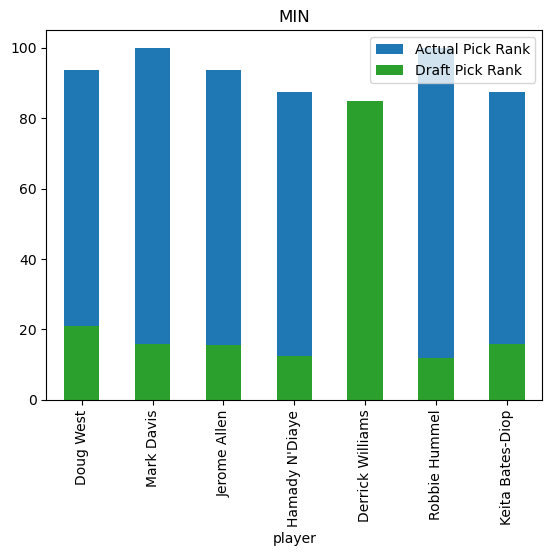

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
776,777,2002,50,50,BOS,Darius Songaila,Wake Forest,8.0,495.0,9229.0,3415.0,1689.0,589.0,0.499,0.158,0.844,18.6,6.9,3.4,1.2,15.9,0.083,-2.1,-0.2,15.0515,78.6985,93.75
951,952,2005,50,50,BOS,Ryan Gomes,Providence,8.0,487.0,13463.0,4926.0,2239.0,712.0,0.445,0.349,0.799,27.6,10.1,4.6,1.5,19.4,0.069,-1.6,1.4,15.0515,84.9485,100.00
1141,1142,2008,60,60,BOS,Semih Erden,0,2.0,69.0,928.0,262.0,190.0,29.0,0.546,0.000,0.594,13.4,3.8,2.8,0.4,1.8,0.094,-3.6,-0.4,11.092437,76.407563,87.50
1253,1254,2010,52,52,BOS,Luke Harangody,Notre Dame,2.0,70.0,871.0,253.0,196.0,36.0,0.376,0.241,0.737,12.4,3.6,2.8,0.5,0.9,0.048,-3.5,-0.3,14.199833,85.800167,100.00
1316,1317,2011,55,55,BOS,E'Twaun Moore,Purdue,10.0,598.0,12564.0,4743.0,1208.0,1055.0,0.455,0.388,0.742,21.0,7.9,2.0,1.8,14.8,0.057,-1.9,0.2,12.981866,87.018134,100.00
1619,1620,2016,58,58,BOS,Abdel Nader,Iowa State,5.0,202.0,2583.0,926.0,376.0,110.0,0.428,0.357,0.718,12.8,4.6,1.9,0.5,2.8,0.052,-2.6,-0.4,11.8286,88.1714,100.00
1831,1832,2020,30,30,BOS,Desmond Bane,TCU,2.0,144.0,3785.0,2009.0,544.0,326.0,0.464,0.435,0.882,26.3,14.0,3.8,2.3,10.1,0.129,1.3,3.2,26.143937,73.856063,100.00


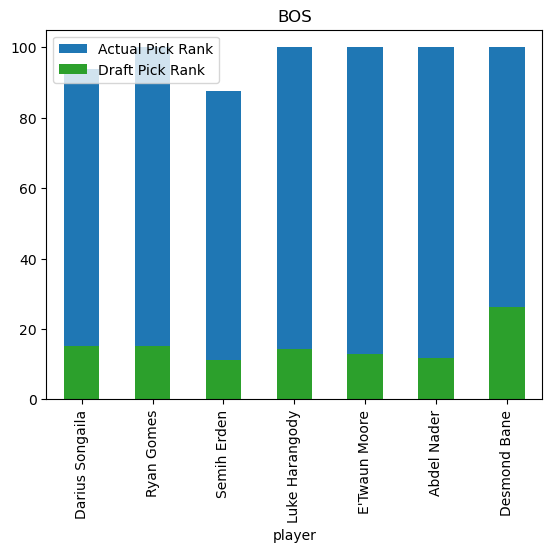

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
487,488,1997,48,48,WAS,Predrag Drobnjak,0,4.0,278.0,5542.0,2187.0,973.0,225.0,0.425,0.340,0.799,19.9,7.9,3.5,0.8,5.6,0.048,-3.0,-1.3,15.937938,77.812062,93.75
671,672,2001,1,1,WAS,Kwame Brown,0,12.0,607.0,13389.0,4035.0,3333.0,554.0,0.492,0.111,0.570,22.1,6.6,5.5,0.9,20.8,0.074,-2.4,-1.3,100.0,-100.0,0.00
822,823,2003,38,38,WAS,Steve Blake,Maryland,13.0,870.0,20823.0,5662.0,1816.0,3446.0,0.401,0.383,0.779,23.9,6.5,2.1,4.0,29.1,0.067,-1.2,4.2,21.01082,78.98918,100.00
950,951,2005,49,49,WAS,Andray Blatche,0,9.0,564.0,12462.0,5706.0,3024.0,798.0,0.467,0.237,0.725,22.1,10.1,5.4,1.4,19.2,0.074,-0.8,3.8,15.490196,84.509804,100.00
1068,1069,2007,47,47,WAS,Dominic McGuire,Fresno State,6.0,342.0,5348.0,939.0,1169.0,422.0,0.419,0.188,0.658,15.6,2.7,3.4,1.2,4.1,0.037,-2.1,-0.1,16.395107,77.354893,93.75
1236,1237,2010,35,35,WAS,Nemanja Bjelica,0,7.0,449.0,9172.0,3412.0,2051.0,826.0,0.466,0.384,0.759,20.4,7.6,4.6,1.8,20.0,0.104,0.3,5.4,22.796598,77.203402,100.00
1487,1488,2014,46,46,WAS,Jordan Clarkson,Missouri,8.0,600.0,16191.0,9216.0,1971.0,1526.0,0.439,0.338,0.827,27.0,15.4,3.3,2.5,21.7,0.064,-0.5,6.2,16.862108,83.137892,100.00


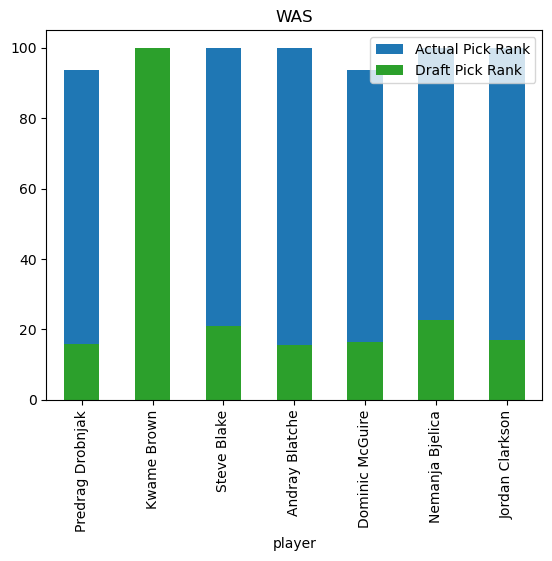

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
202,203,1992,41,41,HOU,Popeye Jones,Murray State,11.0,535.0,12579.0,3726.0,3981.0,696.0,0.447,0.281,0.751,23.5,7.0,7.4,1.3,22.0,0.084,-2.7,-2.1,19.360807,80.639193,100.00
537,538,1998,41,41,HOU,Cuttino Mobley,Rhode Island,11.0,747.0,27618.0,11964.0,2902.0,2015.0,0.433,0.378,0.835,37.0,16.0,3.9,2.7,52.2,0.091,-0.1,12.9,19.360807,80.639193,100.00
650,651,2000,38,38,HOU,Eduardo Nájera,Oklahoma,12.0,619.0,11213.0,3052.0,2307.0,493.0,0.481,0.311,0.671,18.1,4.9,3.7,0.8,24.7,0.106,-0.9,3.0,21.01082,72.73918,93.75
897,898,2004,55,55,HOU,Luis Flores,Manhattan College,1.0,16.0,77.0,35.0,3.0,11.0,0.483,0.500,1.000,4.8,2.2,0.2,0.7,0.0,-0.020,-4.8,0.0,12.981866,74.518134,87.50
1299,1300,2011,38,38,HOU,Chandler Parsons,Florida,9.0,440.0,13246.0,5571.0,1972.0,1201.0,0.462,0.373,0.713,30.1,12.7,4.5,2.7,28.9,0.105,1.1,10.2,21.01082,78.98918,100.00
1666,1667,2017,45,45,HOU,Dillon Brooks,Oregon,5.0,272.0,7674.0,3955.0,829.0,546.0,0.421,0.348,0.799,28.2,14.5,3.0,2.0,5.3,0.033,-3.8,-3.5,17.339374,70.160626,87.50
1727,1728,2018,46,46,HOU,De'Anthony Melton,USC,4.0,235.0,4853.0,1968.0,843.0,660.0,0.409,0.361,0.766,20.7,8.4,3.6,2.8,7.7,0.076,0.5,3.1,16.862108,83.137892,100.00


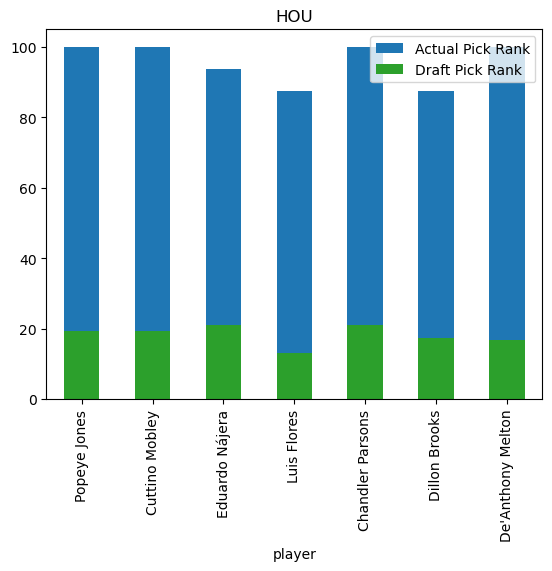

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
82,83,1990,29,29,CHI,Toni Kukoč,0,13.0,846.0,22212.0,9810.0,3555.0,3119.0,0.447,0.335,0.729,26.3,11.6,4.2,3.7,59.6,0.129,2.8,27.2,26.8801,73.1199,100.00
554,555,1998,58,58,CHI,Maceo Baston,Michigan,4.0,105.0,831.0,286.0,175.0,26.0,0.616,0.375,0.740,7.9,2.7,1.7,0.2,2.3,0.134,-1.2,0.2,11.8286,81.9214,93.75
829,830,2003,45,45,CHI,Matt Bonner,Florida,12.0,792.0,13356.0,4632.0,2371.0,552.0,0.464,0.414,0.780,16.9,5.8,3.0,0.7,38.5,0.138,1.0,10.1,17.339374,82.660626,100.00
880,881,2004,38,38,CHI,Chris Duhon,Duke,9.0,606.0,15526.0,3946.0,1364.0,2690.0,0.393,0.363,0.784,25.6,6.5,2.3,4.4,25.0,0.077,-1.2,3.2,21.01082,78.98918,100.00
1070,1071,2007,49,49,CHI,Aaron Gray,Pitt,7.0,318.0,3851.0,1066.0,1190.0,207.0,0.509,0.000,0.562,12.1,3.4,3.7,0.7,6.2,0.077,-3.6,-1.5,15.490196,72.009804,87.50
1291,1292,2011,30,30,CHI,Jimmy Butler,Marquette,11.0,690.0,22864.0,12222.0,3658.0,2836.0,0.460,0.321,0.841,33.1,17.7,5.3,4.1,93.6,0.196,4.7,38.3,26.143937,73.856063,100.00
1899,1900,2021,38,38,CHI,Ayo Dosunmu,Illinois,1.0,77.0,2110.0,679.0,214.0,256.0,0.520,0.376,0.679,27.4,8.8,2.8,3.3,3.0,0.069,-2.0,0.0,21.01082,78.98918,100.00


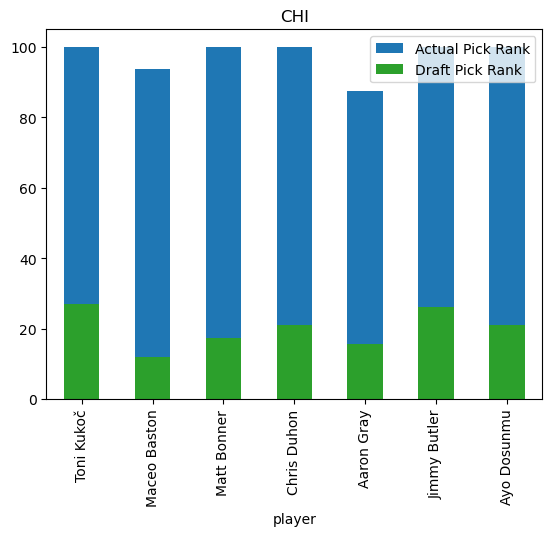

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
211,212,1992,50,50,GSW,Matt Fish,UNC Wilmington,3.0,50.0,512.0,177.0,110.0,25.0,0.500,0.000,0.625,10.2,3.5,2.2,0.5,0.6,0.058,-3.1,-0.1,15.0515,72.4485,87.5
610,611,1999,56,56,GSW,Tim Young,Stanford,1.0,25.0,137.0,54.0,35.0,5.0,0.333,0.000,0.778,5.5,2.2,1.4,0.2,0.2,0.058,-4.9,-0.1,12.590599,74.909401,87.5
700,701,2001,31,31,GSW,Gilbert Arenas,Arizona,11.0,552.0,19351.0,11402.0,2168.0,2909.0,0.421,0.351,0.803,35.1,20.7,3.9,5.3,51.3,0.127,2.6,22.3,25.431915,74.568085,100.0
941,942,2005,40,40,GSW,Monta Ellis,0,12.0,833.0,29011.0,14858.0,2874.0,3856.0,0.451,0.314,0.772,34.8,17.8,3.5,4.6,41.9,0.069,-0.3,12.4,19.897,80.103,100.0
1356,1357,2012,35,35,GSW,Draymond Green,Michigan State,10.0,685.0,19512.0,5960.0,4751.0,3733.0,0.441,0.315,0.712,28.5,8.7,6.9,5.4,52.7,0.130,2.7,23.1,22.796598,77.203402,100.0
1782,1783,2019,41,41,GSW,Eric Paschall,Villanova,3.0,158.0,3085.0,1552.0,509.0,214.0,0.494,0.326,0.758,19.5,9.8,3.2,1.4,5.0,0.078,-2.2,-0.1,19.360807,80.639193,100.0
1799,1800,2019,58,58,GSW,Miye Oni,Yale,3.0,80.0,672.0,145.0,108.0,37.0,0.350,0.330,0.750,8.4,1.8,1.4,0.5,1.0,0.070,-2.5,-0.1,11.8286,75.6714,87.5


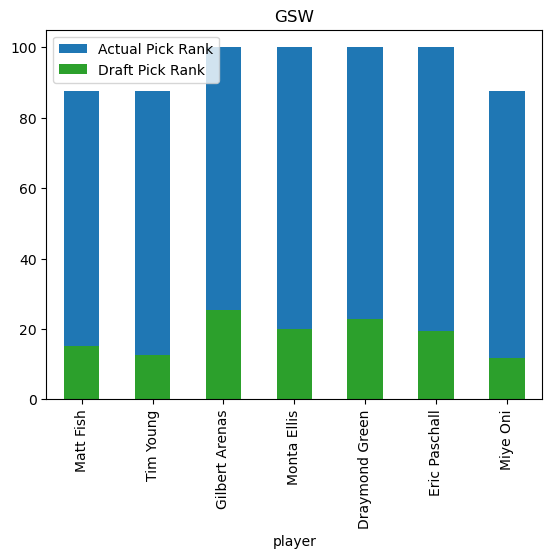

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
437,438,1996,56,56,CLE,Reggie Geary,Arizona,2.0,101.0,931.0,209.0,82.0,110.0,0.344,0.328,0.493,9.2,2.1,0.8,1.1,0.6,0.032,-2.5,-0.1,12.590599,87.409401,100.00
761,762,2002,35,35,CLE,Carlos Boozer,Duke,13.0,861.0,26901.0,13976.0,8192.0,1928.0,0.521,0.071,0.722,31.2,16.2,9.5,2.2,80.3,0.143,1.4,23.1,22.796598,70.953402,93.75
1003,1004,2006,42,42,CLE,Daniel Gibson,Texas,7.0,397.0,9316.0,3115.0,792.0,775.0,0.402,0.407,0.780,23.5,7.8,2.0,2.0,16.0,0.082,-1.0,2.4,18.837535,81.162465,100.00
1187,1188,2009,46,46,CLE,Danny Green,UNC,13.0,819.0,20743.0,7143.0,2811.0,1270.0,0.421,0.399,0.804,25.3,8.7,3.4,1.6,49.1,0.114,1.9,20.2,16.862108,83.137892,100.00
1355,1356,2012,34,34,CLE,Jae Crowder,Marquette,10.0,735.0,18562.0,7056.0,3141.0,1182.0,0.417,0.346,0.777,25.3,9.6,4.3,1.6,40.2,0.104,0.3,10.9,23.426054,76.573946,100.00
1382,1383,2013,1,1,CLE,Anthony Bennett,UNLV,4.0,151.0,1905.0,658.0,472.0,77.0,0.392,0.261,0.670,12.6,4.4,3.1,0.5,0.5,0.013,-4.8,-1.3,100.0,-100.0,0.00
1474,1475,2014,33,33,CLE,Joe Harris,Virginia,8.0,414.0,10601.0,4584.0,1344.0,679.0,0.483,0.439,0.780,25.6,11.1,3.2,1.6,20.5,0.093,-0.5,3.9,24.074303,75.925697,100.00


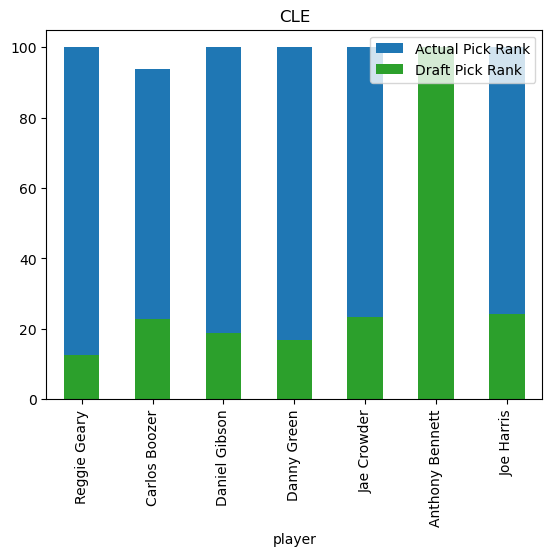

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
35,36,1989,36,36,POR,Clifford Robinson,UConn,18.0,1380.0,42561.0,19591.0,6306.0,3094.0,0.438,0.356,0.689,30.8,14.2,4.6,2.2,89.7,0.101,0.5,26.6,22.184875,77.815125,100.00
486,487,1997,47,47,POR,Alvin Williams,Villanova,9.0,460.0,12610.0,4161.0,1140.0,1877.0,0.421,0.313,0.760,27.4,9.0,2.5,4.1,21.7,0.082,-0.4,4.9,16.395107,83.604893,100.00
1022,1023,2007,1,1,POR,Greg Oden,Ohio State,3.0,105.0,2028.0,840.0,656.0,51.0,0.574,0.000,0.658,19.3,8.0,6.2,0.5,7.3,0.174,-0.4,0.8,100.0,-81.25,18.75
1058,1059,2007,37,37,POR,Josh McRoberts,Duke,11.0,433.0,8271.0,2333.0,1686.0,901.0,0.463,0.340,0.705,19.1,5.4,3.9,2.1,18.5,0.107,0.3,4.7,21.589914,72.160086,93.75
1196,1197,2009,55,55,POR,Patty Mills,Saint Mary's,13.0,820.0,17013.0,7520.0,1390.0,1894.0,0.426,0.389,0.855,20.7,9.2,1.7,2.3,35.3,0.100,0.1,9.0,12.981866,87.018134,100.00
1361,1362,2012,40,40,POR,Will Barton,Memphis,10.0,623.0,16123.0,7246.0,2655.0,1705.0,0.433,0.354,0.787,25.9,11.6,4.3,2.7,26.0,0.077,-0.3,7.1,19.897,80.103,100.00


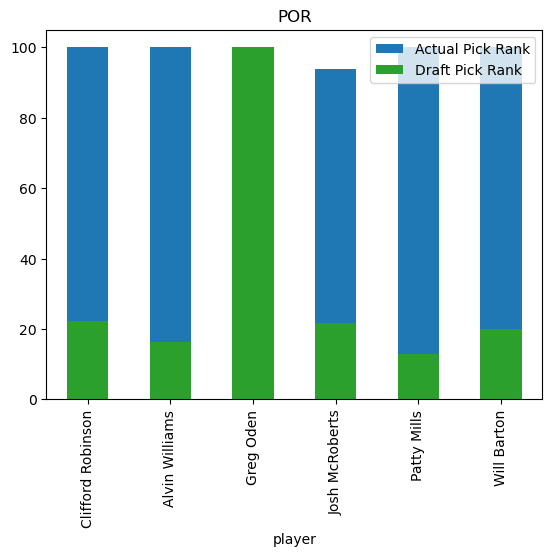

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
144,145,1991,37,37,LAC,Elliot Perry,Memphis,10.0,549.0,9501.0,3449.0,742.0,1699.0,0.459,0.359,0.783,17.3,6.3,1.4,3.1,14.0,0.071,-0.5,3.6,21.589914,72.160086,93.75
497,498,1998,1,1,LAC,Michael Olowokandi,University of the Pacific,9.0,500.0,13129.0,4135.0,3414.0,327.0,0.435,0.000,0.597,26.3,8.3,6.8,0.7,2.5,0.009,-4.6,-8.5,100.0,-93.75,6.25
642,643,2000,30,30,LAC,Marko Jarić,0,7.0,447.0,11246.0,3193.0,1200.0,1600.0,0.404,0.344,0.730,25.2,7.1,2.7,3.6,12.1,0.052,-0.7,3.8,26.143937,73.856063,100.00
1255,1256,2010,54,54,LAC,Willie Warren,Oklahoma,1.0,19.0,134.0,37.0,12.0,27.0,0.371,0.333,0.750,7.1,1.9,0.6,1.4,0.2,0.065,-2.7,0.0,13.380312,86.619688,100.00
1789,1790,2019,48,48,LAC,Terance Mann,Florida State,3.0,189.0,3942.0,1443.0,722.0,366.0,0.491,0.379,0.786,20.9,7.6,3.8,1.9,10.0,0.122,-0.6,1.4,15.937938,84.062062,100.00


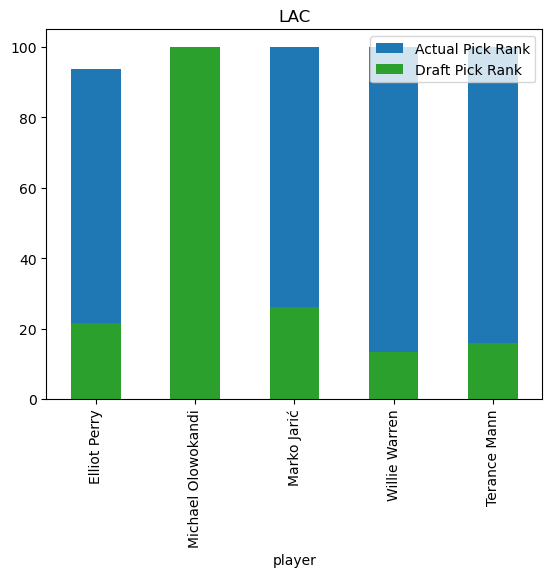

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
48,49,1989,49,49,ATL,Haywoode Workman,Oral Roberts,8.0,359.0,7202.0,1967.0,819.0,1410.0,0.419,0.323,0.764,20.1,5.5,2.3,3.9,10.7,0.071,-0.7,2.4,15.490196,84.509804,100.00
489,490,1997,50,50,ATL,Chris Crawford,Marquette,7.0,252.0,3985.0,1654.0,547.0,154.0,0.437,0.347,0.824,15.8,6.6,2.2,0.6,6.5,0.078,-2.6,-0.6,15.0515,78.6985,93.75
1364,1365,2012,43,43,ATL,Mike Scott,Virginia,9.0,555.0,9182.0,3736.0,1727.0,499.0,0.453,0.362,0.757,16.5,6.7,3.1,0.9,16.8,0.088,-1.7,0.6,18.326577,75.423423,93.75
1428,1429,2013,47,47,ATL,Raul Neto,0,7.0,387.0,6260.0,2313.0,612.0,834.0,0.455,0.366,0.804,16.2,6.0,1.6,2.2,10.1,0.077,-1.6,0.6,16.395107,83.604893,100.00
1431,1432,2013,50,50,ATL,James Ennis III,Cal State Long Beach,8.0,395.0,8022.0,2629.0,1306.0,373.0,0.457,0.360,0.797,20.3,6.7,3.3,0.9,16.2,0.097,-1.5,0.9,15.0515,84.9485,100.00


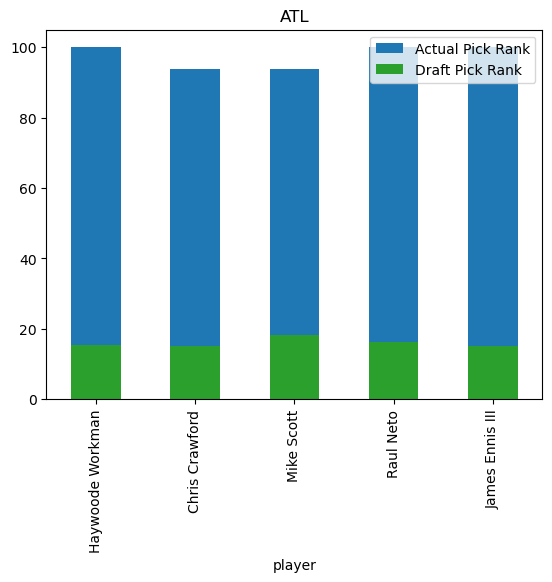

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
550,551,1998,54,54,DEN,Tremaine Fowlkes,Fresno State,4.0,103.0,1233.0,301.0,228.0,54.0,0.409,0.200,0.791,12.0,2.9,2.2,0.5,2.1,0.080,-2.0,0.0,13.380312,86.619688,100.0
551,552,1998,55,55,DEN,Ryan Bowen,Iowa,10.0,507.0,6502.0,1319.0,1060.0,250.0,0.456,0.206,0.693,12.8,2.6,2.1,0.5,12.4,0.092,-0.8,2.0,12.981866,87.018134,100.0
1482,1483,2014,41,41,DEN,Nikola Jokić,0,7.0,527.0,16018.0,10364.0,5456.0,3281.0,0.542,0.345,0.830,30.4,19.7,10.4,6.2,79.6,0.239,8.9,44.0,19.360807,80.639193,100.0
1617,1618,2016,56,56,DEN,Daniel Hamilton,UConn,2.0,25.0,232.0,69.0,52.0,30.0,0.394,0.357,0.500,9.3,2.8,2.1,1.2,0.0,0.000,-3.3,-0.1,12.590599,74.909401,87.5
1672,1673,2017,51,51,DEN,Monte Morris,Iowa State,5.0,280.0,7066.0,2947.0,655.0,1042.0,0.481,0.394,0.830,25.2,10.5,2.3,3.7,18.5,0.125,0.3,4.2,14.621491,85.378509,100.0


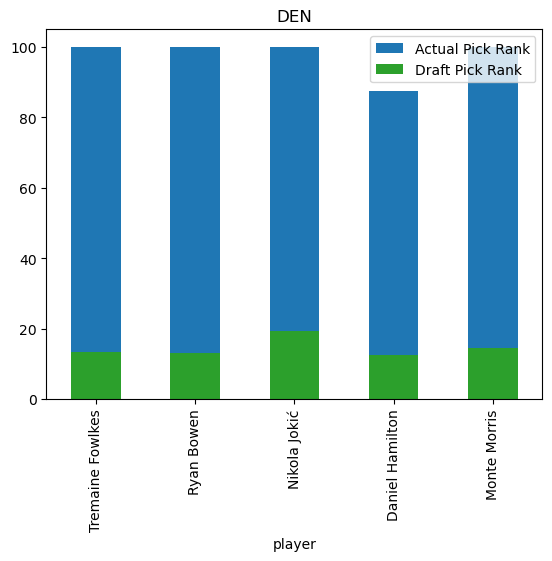

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
243,244,1993,28,28,DAL,Lucious Harris,Cal State Long Beach,12.0,800.0,15701.0,5784.0,1864.0,1130.0,0.426,0.348,0.790,19.6,7.2,2.3,1.4,28.7,0.088,-0.9,4.5,27.642098,72.357902,100.0
549,550,1998,53,53,DAL,Greg Buckner,Clemson,10.0,570.0,10895.0,2878.0,1593.0,719.0,0.450,0.334,0.757,19.1,5.0,2.8,1.3,20.9,0.092,-0.9,3.0,13.786207,86.213793,100.0
1425,1426,2013,44,44,DAL,Mike Muscala,Bucknell,9.0,432.0,6694.0,2666.0,1371.0,378.0,0.458,0.377,0.847,15.5,6.2,3.2,0.9,16.6,0.119,0.2,3.8,17.827366,82.172634,100.0
1735,1736,2018,54,54,DAL,Shake Milton,SMU,4.0,178.0,3713.0,1731.0,413.0,454.0,0.447,0.361,0.819,20.9,9.7,2.3,2.6,6.9,0.090,-1.8,0.2,13.380312,86.619688,100.0


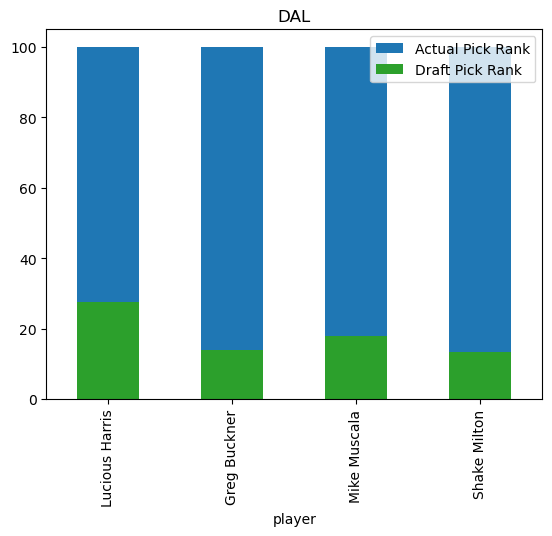

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
772,773,2002,46,46,MEM,Matt Barnes,UCLA,14.0,929.0,21967.0,7589.0,4281.0,1691.0,0.436,0.335,0.745,23.6,8.2,4.6,1.8,42.8,0.093,-0.1,10.7,16.862108,83.137892,100.00
1143,1144,2009,2,2,MEM,Hasheem Thabeet,UConn,5.0,224.0,2357.0,483.0,595.0,27.0,0.567,0.000,0.578,10.5,2.2,2.7,0.1,4.8,0.099,-2.7,-0.4,84.9485,-78.6985,6.25
1436,1437,2013,55,55,MEM,Joffrey Lauvergne,0,4.0,208.0,2823.0,1159.0,789.0,180.0,0.479,0.285,0.719,13.6,5.6,3.8,0.9,5.2,0.089,-2.1,-0.1,12.981866,87.018134,100.00
1912,1913,2021,51,51,MEM,Brandon Boston Jr.,Kentucky,1.0,51.0,760.0,343.0,111.0,51.0,0.385,0.306,0.819,14.9,6.7,2.2,1.0,0.4,0.026,-3.3,-0.3,14.621491,79.128509,93.75


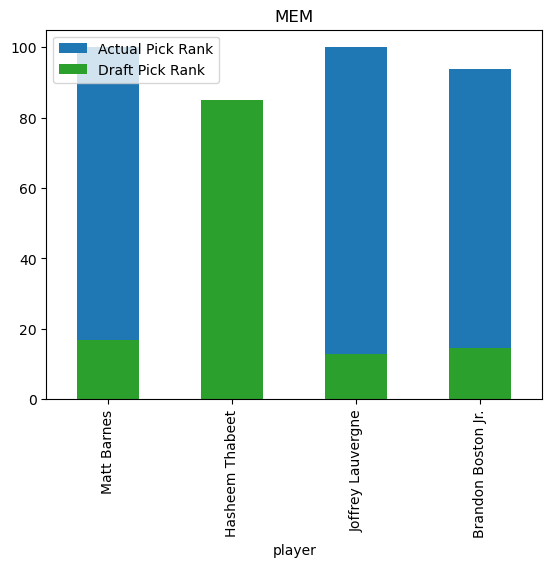

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
996,997,2006,35,35,TOR,P.J. Tucker,Texas,11.0,777.0,22529.0,5536.0,4390.0,1149.0,0.425,0.364,0.748,29.0,7.1,5.6,1.5,40.0,0.085,-0.7,7.2,22.796598,77.203402,100.0
1588,1589,2016,27,27,TOR,Pascal Siakam,New Mexico State,6.0,400.0,11780.0,6290.0,2522.0,1241.0,0.489,0.328,0.774,29.5,15.7,6.3,3.1,33.3,0.136,1.8,11.1,28.431812,71.568188,100.0
1860,1861,2020,59,59,TOR,Jalen Harris,Nevada,1.0,13.0,172.0,96.0,18.0,17.0,0.500,0.472,0.778,13.2,7.4,1.4,1.3,0.3,0.079,0.3,0.1,11.457399,76.042601,87.5
1907,1908,2021,46,46,TOR,Dalano Banton,Nebraska,1.0,64.0,696.0,205.0,124.0,99.0,0.411,0.255,0.591,10.9,3.2,1.9,1.5,0.4,0.030,-3.1,-0.2,16.862108,70.637892,87.5


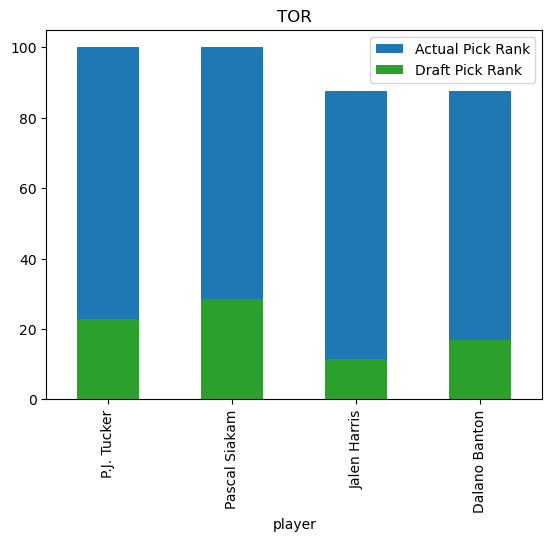

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
826,827,2003,42,42,ORL,Zaza Pachulia,0,16.0,1098.0,22240.0,7414.0,6315.0,1433.0,0.469,0.000,0.751,20.3,6.8,5.8,1.3,52.7,0.114,-1.5,2.9,18.837535,74.912465,93.75
1370,1371,2012,49,49,ORL,Kyle O'Quinn,Norfolk State,8.0,472.0,6714.0,2568.0,2166.0,643.0,0.517,0.218,0.740,14.2,5.4,4.6,1.4,17.8,0.128,0.9,5.0,15.490196,84.509804,100.00
1608,1609,2016,47,47,ORL,Jake Layman,Maryland,6.0,243.0,3099.0,1175.0,417.0,127.0,0.460,0.300,0.719,12.8,4.8,1.7,0.5,3.8,0.059,-2.3,-0.2,16.395107,77.354893,93.75
1787,1788,2019,46,46,ORL,Talen Horton-Tucker,Iowa State,3.0,131.0,2896.0,1216.0,369.0,346.0,0.437,0.276,0.783,22.1,9.3,2.8,2.6,3.3,0.054,-2.3,-0.2,16.862108,76.887892,93.75


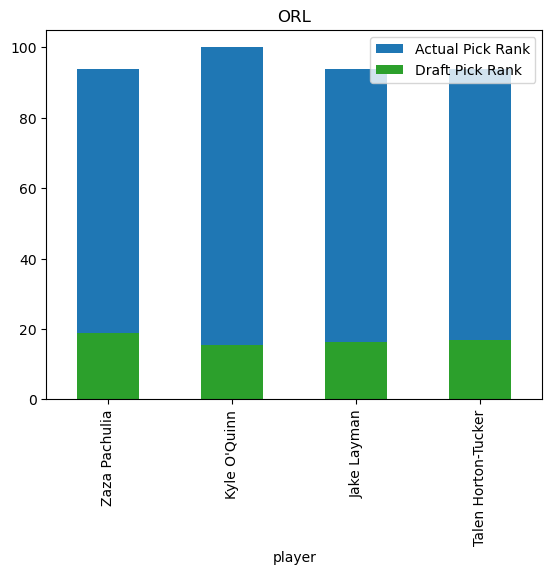

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
885,886,2004,43,43,NYK,Trevor Ariza,UCLA,18.0,1118.0,32953.0,11593.0,5356.0,2379.0,0.422,0.351,0.731,29.5,10.4,4.8,2.1,64.3,0.094,0.6,21.8,18.326577,81.673423,100.00
1240,1241,2010,39,39,NYK,Landry Fields,Stanford,5.0,255.0,6010.0,1731.0,1092.0,419.0,0.473,0.332,0.666,23.6,6.8,4.3,1.6,10.5,0.084,-0.3,2.6,20.44677,79.55323,100.00
1919,1920,2021,58,58,NYK,Jericho Sims,Texas,1.0,41.0,555.0,90.0,169.0,21.0,0.722,0.000,0.414,13.5,2.2,4.1,0.5,1.5,0.128,-1.7,0.0,11.8286,81.9214,93.75


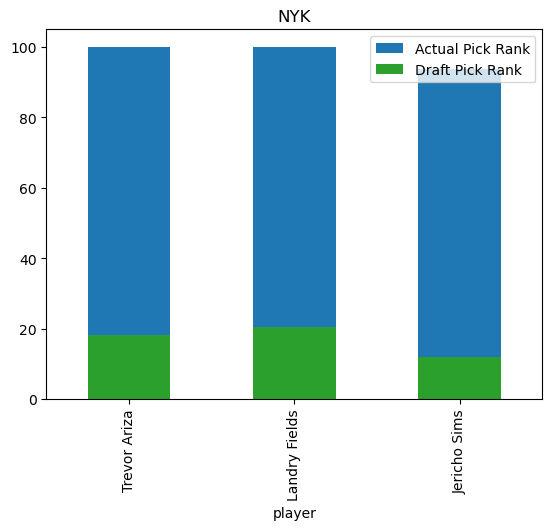

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
425,426,1996,44,44,CHH,Malik Rose,Drexel,13.0,813.0,13404.0,5003.0,3371.0,684.0,0.437,0.177,0.743,16.5,6.2,4.1,0.8,26.5,0.095,-2.1,-0.4,17.827366,82.172634,100.00
597,598,1999,43,43,CHH,Lee Nailon,TCU,6.0,306.0,5820.0,2622.0,936.0,298.0,0.474,0.111,0.786,19.0,8.6,3.1,1.0,8.0,0.066,-2.0,0.0,18.326577,75.423423,93.75
1486,1487,2014,45,45,CHH,Dwight Powell,Stanford,8.0,511.0,9720.0,3926.0,2349.0,524.0,0.585,0.296,0.751,19.0,7.7,4.6,1.0,38.0,0.188,1.3,8.0,17.339374,82.660626,100.00


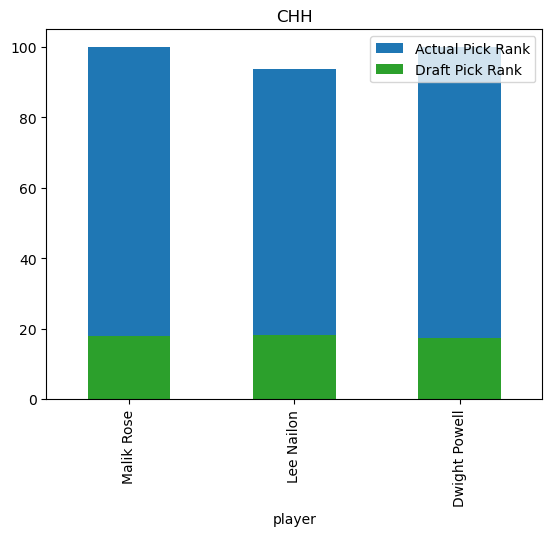

,id,year,rank,overall_pick,team,player,college,years_active,games,minutes_played,points,total_rebounds,assists,field_goal_percentage,3_point_percentage,free_throw_percentage,average_minutes_played,points_per_game,average_total_rebounds,average_assists,win_shares,win_shares_per_48_minutes,box_plus_minus,value_over_replacement,DRAFT_PICK_RANKING,OVERALL_PICK_RANKING,ACTUAL_DRAFT_PICK_RANK
0,1,1989,1,1,SAC,Pervis Ellison,Louisville,11.0,474.0,11593.0,4494.0,3170.0,691.0,0.510,0.050,0.689,24.5,9.5,6.7,1.5,21.8,0.090,-0.5,4.4,100.0,-81.25,18.75
25,26,1989,26,26,LAL,Vlade Divac,0,16.0,1134.0,33838.0,13398.0,9326.0,3541.0,0.495,0.235,0.692,29.8,11.8,8.2,3.1,96.4,0.137,2.3,36.3,29.251333,70.748667,100.00
35,36,1989,36,36,POR,Clifford Robinson,UConn,18.0,1380.0,42561.0,19591.0,6306.0,3094.0,0.438,0.356,0.689,30.8,14.2,4.6,2.2,89.7,0.101,0.5,26.6,22.184875,77.815125,100.00
37,38,1989,38,38,MIN,Doug West,Villanova,12.0,676.0,16649.0,6477.0,1670.0,1292.0,0.481,0.191,0.801,24.6,9.6,2.5,1.9,17.7,0.051,-3.0,-4.2,21.01082,72.73918,93.75
48,49,1989,49,49,ATL,Haywoode Workman,Oral Roberts,8.0,359.0,7202.0,1967.0,819.0,1410.0,0.419,0.323,0.764,20.1,5.5,2.3,3.9,10.7,0.071,-0.7,2.4,15.490196,84.509804,100.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1913,1914,2021,52,52,DET,Luka Garza,Iowa,1.0,32.0,389.0,186.0,100.0,20.0,0.449,0.327,0.623,12.2,5.8,3.1,0.6,0.8,0.093,-2.5,-0.1,14.199833,85.800167,100.00
1914,1915,2021,53,53,PHI,Charles Bassey,Western Kentucky,1.0,23.0,168.0,69.0,62.0,7.0,0.638,0.000,0.750,7.3,3.0,2.7,0.3,0.8,0.220,1.9,0.2,13.786207,73.713793,87.50
1915,1916,2021,54,54,IND,Sandro Mamukelashvili,Seton Hall,1.0,41.0,407.0,154.0,82.0,22.0,0.496,0.423,0.818,9.9,3.8,2.0,0.5,1.1,0.135,-0.3,0.2,13.380312,86.619688,100.00
1916,1917,2021,55,55,OKC,Aaron Wiggins,Maryland,1.0,50.0,1209.0,416.0,178.0,68.0,0.463,0.304,0.729,24.2,8.3,3.6,1.4,1.2,0.048,-4.3,-0.7,12.981866,80.768134,93.75


In [13]:
# Second Approach - Colleges that over and underperformed.
NBA_DRAFT['ACTUAL_DRAFT_PICK_RANK'] = NBA_DRAFT['ACTUAL_DRAFT_PICK_RANK'].astype('float64')

NBA_DRAFT_TEMP = NBA_DRAFT.copy()
NBA_DRAFT_TEMP['ACTUAL_DRAFT_PICK_RANK'] = (NBA_DRAFT_TEMP['ACTUAL_DRAFT_PICK_RANK']/ 16) * 100
NBA_DRAFT_TEMP["OVERALL_PICK_RANKING"] = NBA_DRAFT_TEMP['ACTUAL_DRAFT_PICK_RANK'] - NBA_DRAFT_TEMP["DRAFT_PICK_RANKING"]
percent_threshold = 70
NBA_DRAFT_TEMP = NBA_DRAFT_TEMP[abs(NBA_DRAFT_TEMP["OVERALL_PICK_RANKING"]) >= percent_threshold ]
NBA_DRAFT_TOP_COLLEGES_PROSPECTS = NBA_DRAFT_TEMP.groupby(['team']).count().sort_values(['id'], ascending = False).reset_index()
NBA_DRAFT_TOP_COLLEGES_PROSPECTS = NBA_DRAFT_TOP_COLLEGES_PROSPECTS[(NBA_DRAFT_TOP_COLLEGES_PROSPECTS['id'] > 2)]

# Change code for colleges/NBA teams
# for college in NBA_DRAFT_TOP_COLLEGES_PROSPECTS['college'].to_list():
#     NBA_DRAFT_TOP_COLLEGE_PROSPECTS = NBA_DRAFT_TEMP[NBA_DRAFT_TEMP['college'] == college]

for team in NBA_DRAFT_TOP_COLLEGES_PROSPECTS['team'].to_list():
    NBA_DRAFT_TOP_COLLEGE_PROSPECTS = NBA_DRAFT_TEMP[NBA_DRAFT_TEMP['team'] == team]

    ROWS = 2
    COLUMNS = math.ceil(NBA_DRAFT_TOP_COLLEGE_PROSPECTS.shape[0]/2)

    i = y = x = 0

    display(NBA_DRAFT_TOP_COLLEGE_PROSPECTS)

    ax = NBA_DRAFT_TOP_COLLEGE_PROSPECTS.plot(x = 'player', y = 'ACTUAL_DRAFT_PICK_RANK', kind="bar", rot=0)
    NBA_DRAFT_TOP_COLLEGE_PROSPECTS.plot(x = 'player', y = "DRAFT_PICK_RANKING", kind="bar", ax=ax, color="C2", rot=0)
    plt.xticks(rotation='vertical')
    ax.set(title = team)

    ax.legend(['Actual Pick Rank', 'Draft Pick Rank'])

    plt.show()


NBA_DRAFT_TEMP

        c. Explain and present your findings with tables and visuals. What additional research areas would you focus on if given the opportunity to expand this study?

In [ ]:
# In report.

In [14]:
# Code for Question #2 Part B
# YEAR = 1996
# NDY = NBA_DRAFT[NBA_DRAFT['year'] == YEAR]

# plt.plot(NDY["overall_pick"], NDY['points'], 'o')

# plt.title('1996 - points')
# a, b = np.polyfit(NDY["overall_pick"], NDY['points'], 1)
# column_name = 'points_RANK'
# NDY[column_name] = (a * NDY["overall_pick"]) + b
# # NDY['OVERALL_PICK_RANKING'] = NDY[COLUMN] - NDY[column_name]
# # NDY['ACTUAL_DRAFT_PICK_RANK'] = np.where((NDY['OVERALL_PICK_RANKING'] > 0), NDY['ACTUAL_DRAFT_PICK_RANK'] + 1, NDY['ACTUAL_DRAFT_PICK_RANK']+ 0)

# plt.plot(NDY["overall_pick"], (a*NDY["overall_pick"]+b))  

# # NDY
# plt.show()